## 🧾 Описание датасета IEEE Fraud Detection

Этот датасет был создан в рамках соревнования на Kaggle совместно с компанией **Vesta Corporation**, поставщиком решений для цифровой безопасности.  
**Цель:** спрогнозировать, является ли онлайн-транзакция мошеннической (целевая переменная `isFraud`).

---

## 📁 Структура датасета

### 🔹 Обучающая выборка
- `train_transaction.csv` — данные о транзакциях
- `train_identity.csv` — данные об устройстве, IP, браузере, ОС и пр., используемых во время транзакции

### 🔹 Тестовая выборка
- `test_transaction.csv`
- `test_identity.csv`

Обе таблицы соединяются по колонке `TransactionID`.

---

## 🎯 Целевая переменная
- `isFraud` — бинарный флаг:
  - `1`: транзакция — мошенническая
  - `0`: транзакция — легитимная

---

## 🧩 Признаки

### 📦 Transaction Features

| Признак           | Описание |
|-------------------|----------|
| `TransactionID`   | Уникальный ID транзакции |
| `TransactionDT`   | Временная метка (в секундах от некой базовой точки) |
| `TransactionAMT`  | Сумма транзакции (в долларах США) |
| `ProductCD`       | Код продукта |
| `card1`-`card6`   | Информация о платёжной карте: ID карты, тип, банк, страна и т.д. |
| `addr1`, `addr2`  | Географическая информация (адрес, штат и т.д.) |
| `dist1`, `dist2`  | Расстояние от пользователя до магазина или устройства |
| `P_emaildomain`, `R_emaildomain` | Email-домен покупателя и получателя |
| `C1`–`C14`        | Различные счётчики, связанные с транзакциями (например, кол-во карт, устройств, адресов) |
| `D1`–`D15`        | Временные дельты — количество дней с последней транзакции и т.д. |
| `M1`–`M9`         | Бинарные флаги сопоставления (например, совпадает ли адрес доставки и биллинга) |
| `V1`–`V339`       | Скрытые признаки, созданные системой Vesta (feature engineering) |

---

### 🧠 Identity Features

| Признак           | Описание |
|-------------------|----------|
| `DeviceType`      | Тип устройства (desktop / mobile) |
| `DeviceInfo`      | Информация об устройстве (например, модель или браузер) |
| `id_12`–`id_38`   | Признаки, связанные с IP, прокси, ISP, операционной системой и прочими параметрами пользователя. Их конкретное значение скрыто по соображениям конфиденциальности. |

---

## 🗃 Категориальные признаки

Некоторые из них:

- `ProductCD`
- `card1` – `card6`
- `addr1`, `addr2`
- `P_emaildomain`, `R_emaildomain`
- `M1` – `M9`
- `DeviceType`, `DeviceInfo`
- `id_12` – `id_38`

---

## ⚠ Особенности

- **Сильно несбалансированный датасет:** мошеннические транзакции — лишь малая часть выборки.
- **Псевдовременная метка (`TransactionDT`)** — может использоваться для создания временных признаков.
- **Много пропусков и выбросов** — важно тщательно обрабатывать данные.
- **Скрытые признаки `Vxxx`** — важно использовать отброс шума и методы отбора признаков.

# 0. Реализация вспомогательных функций

In [1]:
# Базовые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Чтобы красиво отображались графики
import warnings
warnings.filterwarnings('ignore')
sns.set(style="whitegrid")
#plt.style.use("seaborn-dark")

In [2]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.metrics import recall_score, precision_score


def eval(model, X_val, y_val):
    y_pred = model.predict(X_val)
    # Предсказания вероятностей
    y_pred_proba = model.predict_proba(X_val)[:, 1]


    # Recall
    recall = recall_score(y_val, y_pred)
    print(f"Recall: {recall:.4f}")

    # Precision
    precision = precision_score(y_val, y_pred)
    print(f"Precision: {precision:.4f}")

    # ROC-AUC
    roc_auc = roc_auc_score(y_val, y_pred_proba)
    print(f'ROC-AUC: {roc_auc:.4f}')

    # PR-AUC
    pr_auc = average_precision_score(y_val, y_pred_proba)
    print(f'PR-AUC: {pr_auc:.4f}')

    # --- ROC-AUC ---
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.4f})', color='blue')
    plt.plot([0, 1], [0, 1], 'k--')  # диагональ
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

    # --- PR-AUC ---
    precision, recall, thresholds = precision_recall_curve(y_val, y_pred_proba)
    pr_auc = average_precision_score(y_val, y_pred_proba)

    plt.figure(figsize=(8,6))
    plt.plot(recall, precision, label=f'PR curve (area = {pr_auc:.4f})', color='green')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall (PR) Curve')
    plt.legend(loc='lower left')
    plt.grid()
    plt.show()

In [3]:

def show_feature_details(df, col, top=10):
    print(f'\nАнализ признака: {col}')
    print(df[col].value_counts(normalize=True).head(top))

    fature_counts = df[col].value_counts(normalize=True) * 100

    # Построение круговой диаграммы
    plt.figure(figsize=(10,10))
    plt.pie(fature_counts, labels=fature_counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(f'Распределение по {col}')
    plt.axis('equal')
    plt.show()


    fraud_rate = df.groupby(col)['isFraud'].mean().sort_values(ascending=False)
    plt.figure(figsize=(12,4))
    fraud_rate.head(top).plot(kind='bar')
    plt.title(f'Доля мошенничества по {col}')
    plt.ylabel('Доля мошенничества')
    plt.show()

## 1. Загрузка данных и базовая очистка

In [4]:
# Импортируем библиотеки
import pandas as pd
import numpy as np

# Путь к данным
PATH_TRANSACTION = '../data/raw/ieee-fraud-detection/train_transaction.csv'
PATH_IDENTITY = '../data/raw/ieee-fraud-detection/train_identity.csv'

# Загрузка данных
transaction = pd.read_csv(PATH_TRANSACTION)
identity = pd.read_csv(PATH_IDENTITY)

print(f"Размер train_transaction: {transaction.shape}")
print(f"Размер train_identity: {identity.shape}")

# Объединяем по TransactionID
train = transaction.merge(identity, how='left', on='TransactionID')

print(f"Итоговый размер train: {train.shape}")

# Быстрый осмотр данных
print(train.head())


Размер train_transaction: (590540, 394)
Размер train_identity: (144233, 41)
Итоговый размер train: (590540, 434)
   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987000        0          86400            68.5         W  13926   
1        2987001        0          86401            29.0         W   2755   
2        2987002        0          86469            59.0         W   4663   
3        2987003        0          86499            50.0         W  18132   
4        2987004        0          86506            50.0         H   4497   

   card2  card3       card4  card5  ...                id_31  id_32  \
0    NaN  150.0    discover  142.0  ...                  NaN    NaN   
1  404.0  150.0  mastercard  102.0  ...                  NaN    NaN   
2  490.0  150.0        visa  166.0  ...                  NaN    NaN   
3  567.0  150.0  mastercard  117.0  ...                  NaN    NaN   
4  514.0  150.0  mastercard  102.0  ...  samsung browser 6.2   32.0  

### Базовая очистка данных

In [5]:
# 4. Приведение типов
# Категориальные признаки, которые явно известны
categorical_features = [
    'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
    'addr1', 'addr2', 'P_emaildomain', 'R_emaildomain',
    'DeviceType', 'DeviceInfo'
]

# identity категориальные признаки
identity_categoricals = [col for col in train.columns if col.startswith('id_')]
categorical_features += identity_categoricals

# M-признаки — бинарные (но иногда могут быть NaN)
m_features = [col for col in train.columns if col.startswith('M')]
categorical_features += m_features

# Оставляем только те, что остались в train
categorical_features = [col for col in categorical_features if col in train.columns]

# Каст категориальных в str/categorical
for col in categorical_features:
    train[col] = train[col].astype('category')

🧹 Рекомендуется удалить 232 колонок (>30% пропусков):
id_24    0.991962
id_25    0.991310
id_07    0.991271
id_08    0.991271
id_21    0.991264
           ...   
V1       0.472935
M2       0.459071
M3       0.459071
M1       0.459071
D3       0.445149
Length: 232, dtype: float64

🧹 Рекомендуется удалить 194863 строк (>50% пропусков)


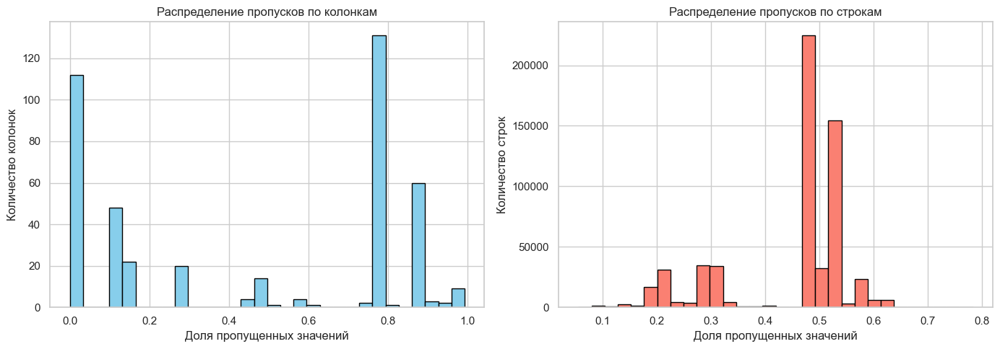

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Доля пропусков по колонкам
missing_col = train.isnull().mean().sort_values(ascending=False)
high_null_cols = missing_col[missing_col > 0.3]  # порог 30%

print(f"🧹 Рекомендуется удалить {len(high_null_cols)} колонок (>{30}% пропусков):")
print(high_null_cols)

# 2. Доля пропусков по строкам
missing_row = train.isnull().mean(axis=1)
high_null_rows = missing_row[missing_row > 0.5]

print(f"\n🧹 Рекомендуется удалить {len(high_null_rows)} строк (>{50}% пропусков)")

# 3. Визуализация
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Гистограмма пропусков по колонкам
ax[0].hist(missing_col, bins=30, color='skyblue', edgecolor='black')
ax[0].set_title('Распределение пропусков по колонкам')
ax[0].set_xlabel('Доля пропущенных значений')
ax[0].set_ylabel('Количество колонок')

# Гистограмма пропусков по строкам
ax[1].hist(missing_row, bins=30, color='salmon', edgecolor='black')
ax[1].set_title('Распределение пропусков по строкам')
ax[1].set_xlabel('Доля пропущенных значений')
ax[1].set_ylabel('Количество строк')

plt.tight_layout()
plt.show()


### ✅ 1. Удаление колонок с большим количеством пропусков

In [7]:
# Порог: удалим все столбцы, где > 30% пропусков
threshold_col = 0.3
missing_ratio_col = train.isnull().mean()

cols_to_drop = missing_ratio_col[missing_ratio_col > threshold_col].index.tolist()
df_cleaned = train.drop(columns=cols_to_drop)

print(f"Удалено {len(cols_to_drop)} колонок:", cols_to_drop)


Удалено 232 колонок: ['dist1', 'dist2', 'R_emaildomain', 'D2', 'D3', 'D5', 'D6', 'D7', 'D8', 'D9', 'D11', 'D12', 'D13', 'D14', 'M1', 'M2', 'M3', 'M4', 'M5', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232

### ✅ 2. Удаление строк с большим количеством пропусков

In [8]:
# Порог: удалим строки, где > 50% значений пропущены
threshold_row = 0.5
missing_ratio_row = train.isnull().mean(axis=1)

rows_to_drop = train[missing_ratio_row > threshold_row].index
df_cleaned = df_cleaned.drop(index=rows_to_drop)

print(f"Удалено {len(rows_to_drop)} строк")


Удалено 194863 строк


In [9]:
df_cleaned.shape

(395677, 202)

🧩 Шаг 1: Разделим признаки по типу

In [10]:
# Числовые и категориальные признаки
num_cols = df_cleaned.select_dtypes(include=['number']).columns
cat_cols = df_cleaned.select_dtypes(include=['object', 'category']).columns

🧩 Шаг 2: Заполним числовые признаки (медианой — устойчиво к выбросам)

In [11]:
for col in num_cols:
    if df_cleaned[col].isnull().any():
        median = df_cleaned[col].median()
        df_cleaned[col].fillna(median, inplace=True)


🧩 Шаг 3: Заполним категориальные признаки (модой или 'Unknown')

In [12]:
for col in cat_cols:
    if df_cleaned[col].isnull().any():
        mode = df_cleaned[col].mode(dropna=True)
        if not mode.empty:
            df_cleaned[col].fillna(mode[0], inplace=True)
        else:
            df_cleaned[col].fillna('Unknown', inplace=True)


🧩 Шаг 4: Проверим, всё ли заполнено

In [13]:
missing_summary = df_cleaned.isnull().sum()
print("Оставшиеся пропуски по столбцам:\n", missing_summary[missing_summary > 0])


Оставшиеся пропуски по столбцам:
 Series([], dtype: int64)


In [14]:
df_cleaned['TransactionDT'].head()

2    86469
4    86506
5    86510
6    86522
8    86535
Name: TransactionDT, dtype: int64

## 2. Обзор признаков - Корреляционная матрица

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Посмотрим распределение целевой переменной
print(df_cleaned['isFraud'].value_counts(normalize=True))

# Выберем только числовые признаки для корреляции
numeric_features = df_cleaned.select_dtypes(include=[np.number])

# Посчитаем корреляцию с целевой переменной
correlation_matrix = numeric_features.corr()

# Корреляция признаков с целевой переменной
cor_target = correlation_matrix['isFraud'].sort_values(ascending=False)
print("Топ признаков, наиболее коррелирующих с isFraud:\n", cor_target.head(15))


isFraud
0    0.95949
1    0.04051
Name: proportion, dtype: float64
Топ признаков, наиболее коррелирующих с isFraud:
 isFraud    1.000000
V45        0.267240
V86        0.261791
V87        0.260982
V44        0.247916
V52        0.220767
V51        0.205931
V40        0.191987
V79        0.188533
V38        0.184350
V39        0.182846
V94        0.178489
V43        0.176951
V33        0.176574
V15        0.174457
Name: isFraud, dtype: float64


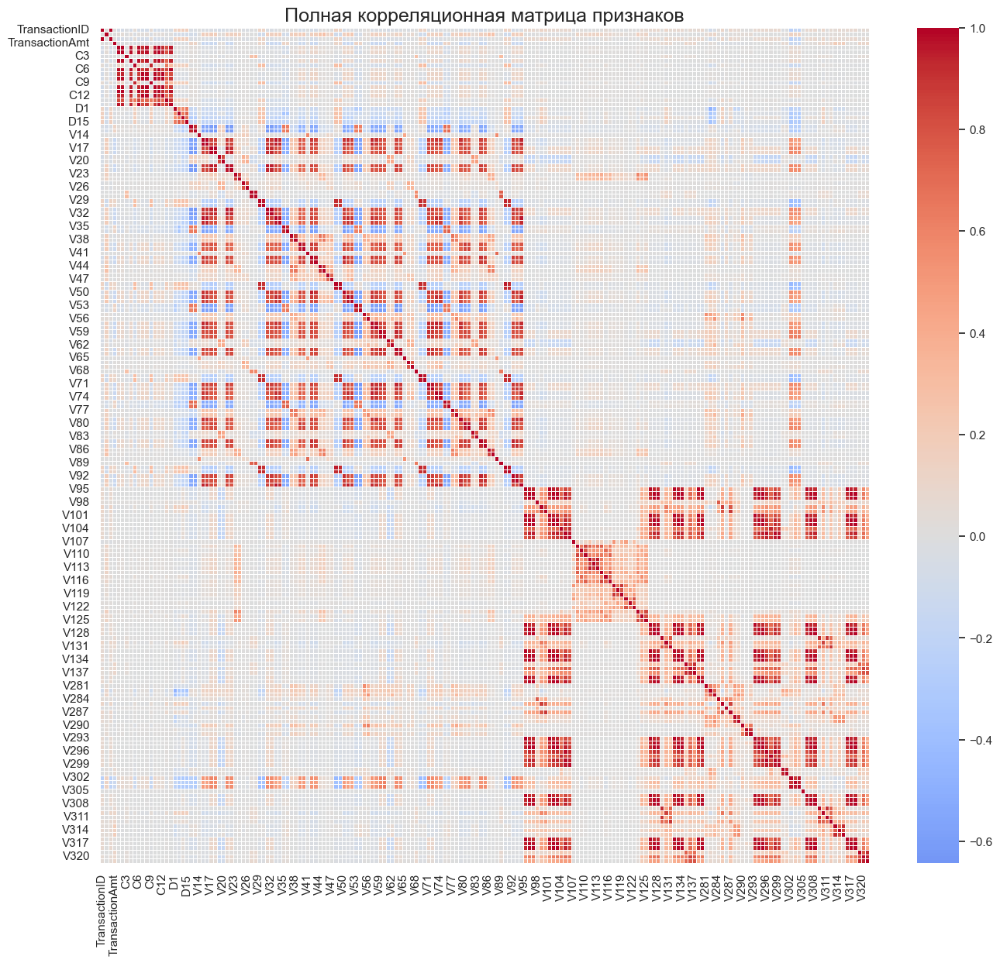

In [16]:
# Тепловая карта всей корреляционной матрицы
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Полная корреляционная матрица признаков', fontsize=18)
plt.show()

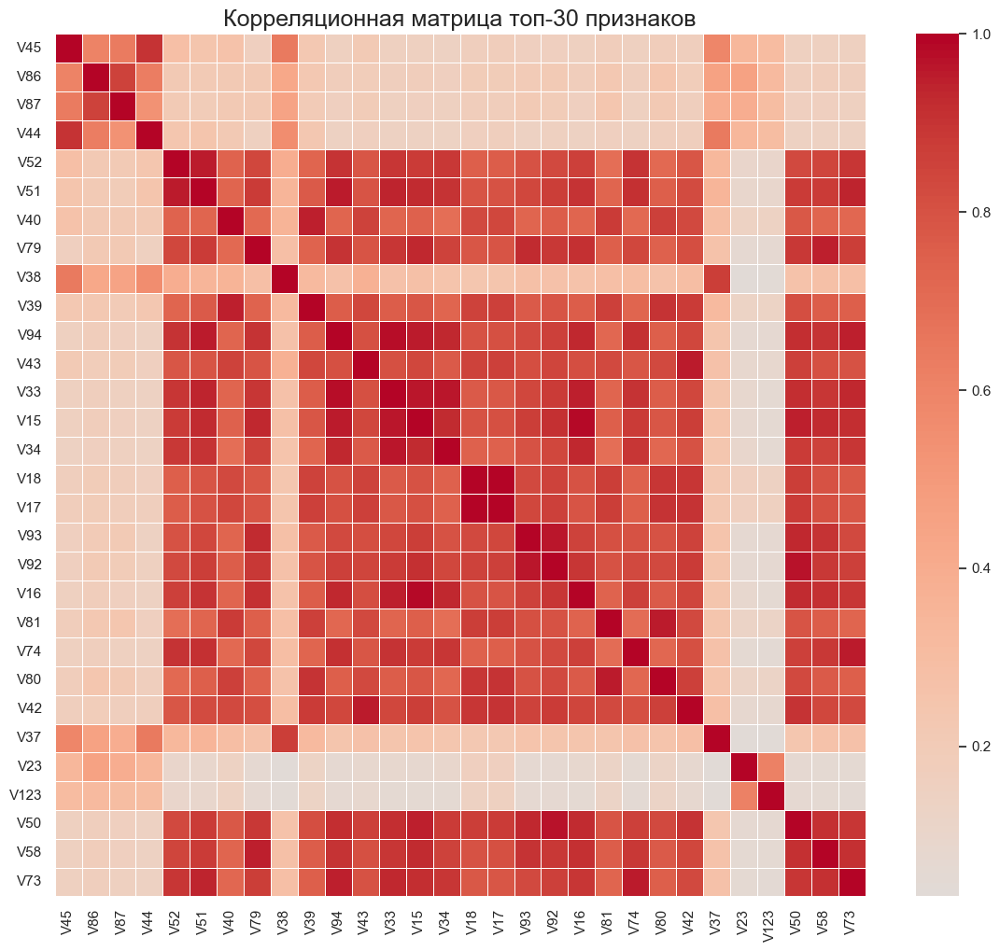

In [17]:
# тепловая карта только топ-30 признаков
top_features = cor_target.index[1:31]  # исключаем сам isFraud
plt.figure(figsize=(14, 12))
sns.heatmap(train[top_features].corr(), cmap='coolwarm', center=0, annot=False, linewidths=0.5)
plt.title('Корреляционная матрица топ-30 признаков', fontsize=18)
plt.show()

Как мы видимо, сильно коррелируемые признаки трудно интерпретируемы

## Расширенный EDA для антифрод-датасета

### 1. Базовое описание данных

In [18]:
numeric_features = df_cleaned.select_dtypes(include=['number']).columns
categorical_features = df_cleaned.select_dtypes(include=['object', 'category']).columns

# Размеры датасета
print(f'Размеры датасета: {df_cleaned.shape[0]} строк, {df_cleaned.shape[1]} признаков.')

# Доли классов
print(df_cleaned['isFraud'].value_counts(normalize=True))

# Доля пропусков по признакам
missing_values = df_cleaned.isnull().mean().sort_values(ascending=False)
print(missing_values[missing_values > 0])

# Типы признаков
print('Категориальные признаки:', len(categorical_features))
print('Числовые признаки:', len(numeric_features))


Размеры датасета: 395677 строк, 202 признаков.
isFraud
0    0.95949
1    0.04051
Name: proportion, dtype: float64
Series([], dtype: float64)
Категориальные признаки: 11
Числовые признаки: 191


### 2.Анализ признака TransactionDT

> Важно! Так как `TransactionDT` - Временная метка (в секундах от некой базовой точки), то преобразования в новые признаки условное.

#### Нормализовать временные метки


Так как мы не знаем точной базовой точки, можно нормализовать временные метки, приведя их к более понятному формату. Например, мы можем посчитать, сколько прошло времени от самой первой транзакции и работать с этим диапазоном.

In [19]:
df_modified = df_cleaned.copy()

In [20]:
# Найдем минимальное значение
min_timestamp = df_modified['TransactionDT'].min()

# Преобразуем временные метки относительно минимальной
df_modified['Relative_TransactionDT'] = df_modified['TransactionDT'] - min_timestamp

# Преобразуем в дни, часы, минуты и т.д.
df_modified['Transaction_day'] = df_modified['Relative_TransactionDT'] // (24 * 60 * 60)  # в днях
df_modified['Transaction_hour'] = (df_modified['Relative_TransactionDT'] // 3600) % 24  # в часах
df_modified['Transaction_weekday'] = (df_modified['Relative_TransactionDT'] // (3600*24)) % 7
df_modified['Transaction_day'] = df_modified['Transaction_day'].astype(int)
df_modified['Transaction_hour'] = df_modified['Transaction_hour'].astype(int)
df_modified['Transaction_weekday'] = df_modified['Transaction_weekday'].astype(int)

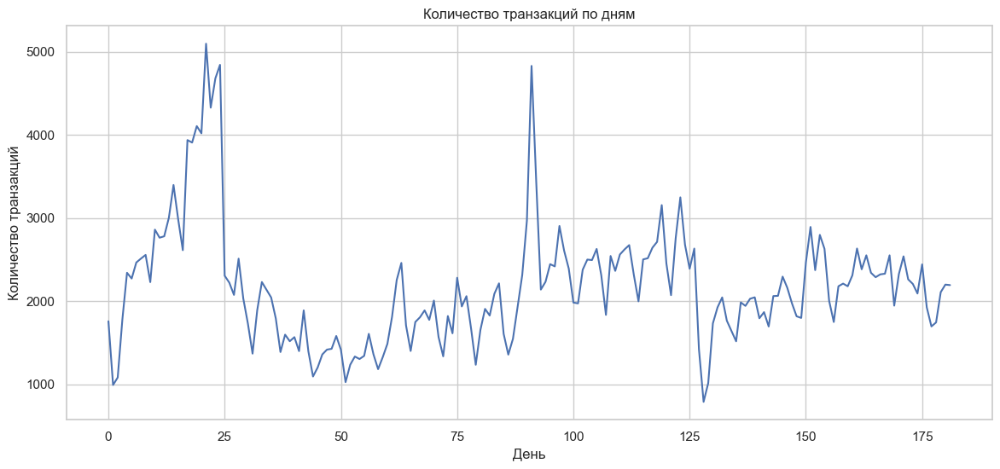

In [21]:
# Количество транзакций во времени
plt.figure(figsize=(14,6))
df_modified.groupby('Transaction_day').size().plot()
plt.title('Количество транзакций по дням')
plt.xlabel('День')
plt.ylabel('Количество транзакций')
plt.show()

#### График: Количество транзакций по дням

1. **Тренды и Пики:**
   - Наблюдаются несколько пиков, особенно в начале периода и ближе к середине.
   - Присутствует высокая изменчивость в количестве транзакций.
 
2. **Сезонность:**
   - Возможные периоды увеличения активности, что может быть связано с внешними факторами, например, акциями или праздниками.
  
3. **Общий Уровень:**
   - Тренд показывает небольшое снижение активности после первой половины, что может указывать на изменения в операционной среде или структуре данных.


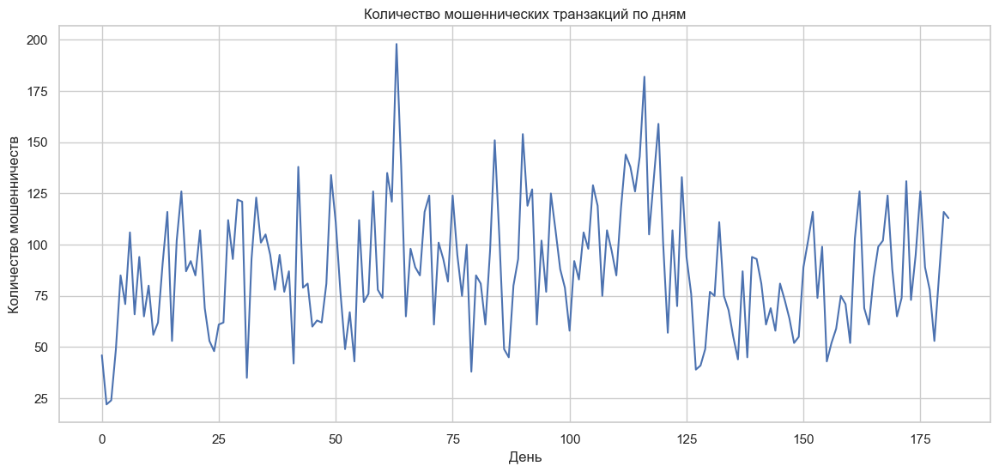

In [22]:
# Количество мошенничеств во времени
plt.figure(figsize=(14,6))
df_modified[df_modified['isFraud'] == 1].groupby('Transaction_day').size().plot()
plt.title('Количество мошеннических транзакций по дням')
plt.xlabel('День')
plt.ylabel('Количество мошенничеств')
plt.show()


#### График: Количество мошеннических транзакций по дням

1. **Тренды и Пики:**
   - Наблюдаются частые колебания в количестве мошеннических транзакций, но, в отличие от общего числа транзакций, их уровень более стабильный.

2. **Сезонность и Корреляция:**
   - Сезонные пики совпадают с общим графиком транзакций, что может указывать на то, что увеличение общего количества транзакций сопутствует и мошеннической активности.

3. **Общий Уровень:**
   - Явная волатильность свидетельствует о непредсказуемости мошеннических действий, хотя в целом показатели имеют тенденцию к снижению в течение времени.


### Общий вывод

- **Сопоставление графиков:** Пики и спады в количестве транзакций и мошеннических операций часто совпадают, указывая на возможную взаимосвязь между общим объемом транзакций и мошеннической активностью.
- **Возможные внешние влияния:** Стоит учитывать влияние сезонных факторов или маркетинговых кампаний, которые могут влиять на активность транзакций.

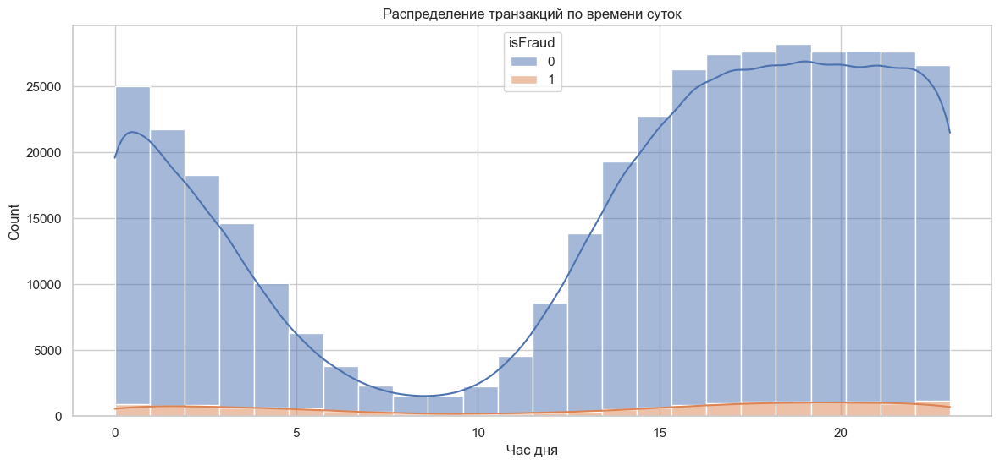

In [23]:
# Время суток
plt.figure(figsize=(14,6))
sns.histplot(data=df_modified, x='Transaction_hour', hue='isFraud', bins=24, kde=True, multiple='stack')
plt.title('Распределение транзакций по времени суток')
plt.xlabel('Час дня')
plt.show()

### Анализ графика распределения транзакций по времени суток

1. **Общая активность:**
   - Наибольшее количество транзакций происходит в вечерние и ночные часы (пик около 16-23 часов).
   - Самое низкое количество транзакций наблюдается около 6-10 часов утра.

2. **Мошеннические транзакции:**
   - Хотя количество мошеннических транзакций значительно ниже общего числа транзакций, их распределение по времени суток похоже на распределение обычных транзакций.
   - Мошеннические активности также снижаются утром и увеличиваются вечером.

3. **Интерпретации:**
   - Активность пользователей и, возможно, мошенническая активность связаны с суточной активностью людей, как в рабочее, так и в нерабочее время.
   - Необходимы дополнительные исследования, чтобы определить, связаны ли пики мошенничества с особыми событиями или условиями.

In [24]:
df_modified[['TransactionDT', 'Relative_TransactionDT','Transaction_day', 'Transaction_hour']]

,TransactionDT,Relative_TransactionDT,Transaction_day,Transaction_hour
2,86469,0,0,0
4,86506,37,0,0
5,86510,41,0,0
6,86522,53,0,0
8,86535,66,0,0
...,...,...,...,...
590534,15811030,15724561,181,23
590536,15811049,15724580,181,23
590537,15811079,15724610,181,23
590538,15811088,15724619,181,23


### 3. Анализ целевой переменной isFraud

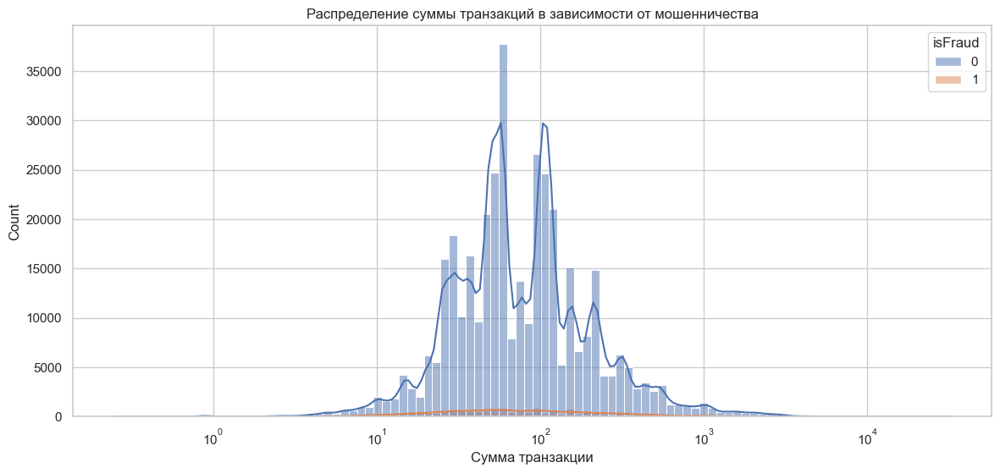

Топ-10 признаков по корреляции с isFraud:
V45    0.267240
V86    0.261791
V87    0.260982
V44    0.247916
V52    0.220767
V51    0.205931
V40    0.191987
V79    0.188533
V38    0.184350
V39    0.182846
Name: isFraud, dtype: float64


In [25]:
# Распределение сумм транзакций
plt.figure(figsize=(14,6))
sns.histplot(data=df_modified, x='TransactionAmt', hue='isFraud', bins=100, log_scale=True, kde=True)
plt.title('Распределение суммы транзакций в зависимости от мошенничества')
plt.xlabel('Сумма транзакции')
plt.show()

# Топ-10 признаков по корреляции с isFraud
fraud_corr = df_modified[numeric_features].corr()['isFraud'].drop('isFraud').abs().sort_values(ascending=False)
print('Топ-10 признаков по корреляции с isFraud:')
print(fraud_corr.head(10))


**Описание графика**

Ось X (логарифмическая шкала) — это сумма транзакции (TransactionAmt). Сразу видно, что большинство транзакций сосредоточены в диапазоне от примерно 10 до 1000 единиц.

Ось Y — это количество транзакций.

Цвета:
- Синие столбцы — обычные транзакции (isFraud = 0).
- Оранжевая линия/заливка (еле видная) — мошеннические транзакции (isFraud = 1).

Что видно:
- Обычных транзакций очень много по сравнению с мошенническими.
- Распределение транзакций сильно скошено вправо (много маленьких сумм, мало больших).
- Мошеннические транзакции встречаются реже и скорее всего имеют свои "специфические" диапазоны сумм, хотя визуально их не видно на фоне всех транзакций.


**Краткий вывод по графику**:

- Большинство транзакций — на небольшие суммы.
- Мошеннические транзакции — редкие и тонут в основном распределении.

### 4. Анализ категориальных признаков

### Анализ признака ProductCD


Анализ признака: ProductCD
ProductCD
W    0.744522
C    0.116028
R    0.063838
H    0.055922
S    0.019690
Name: proportion, dtype: float64


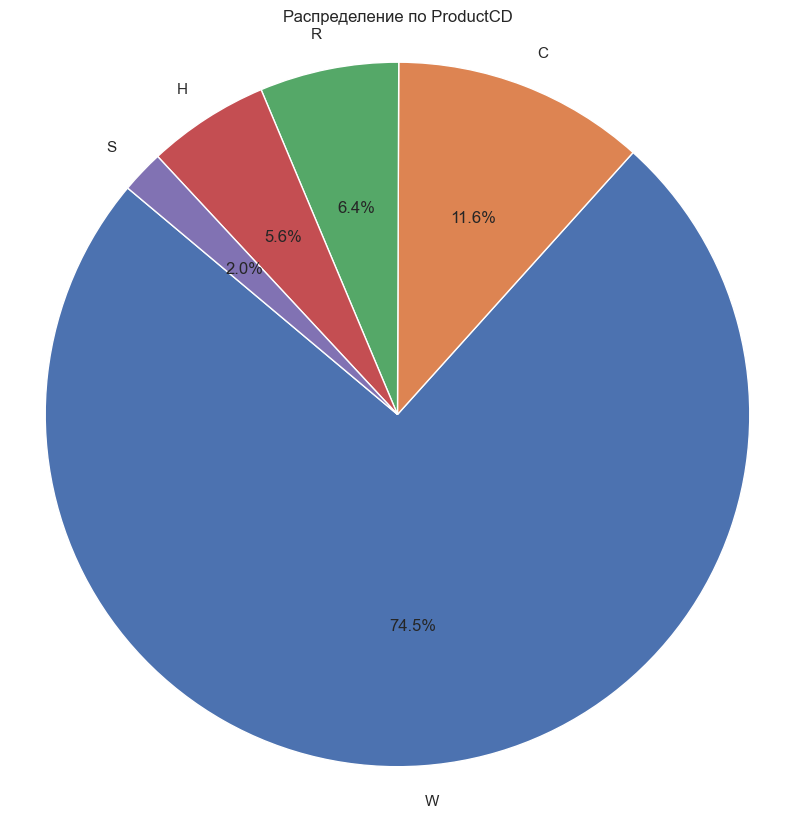

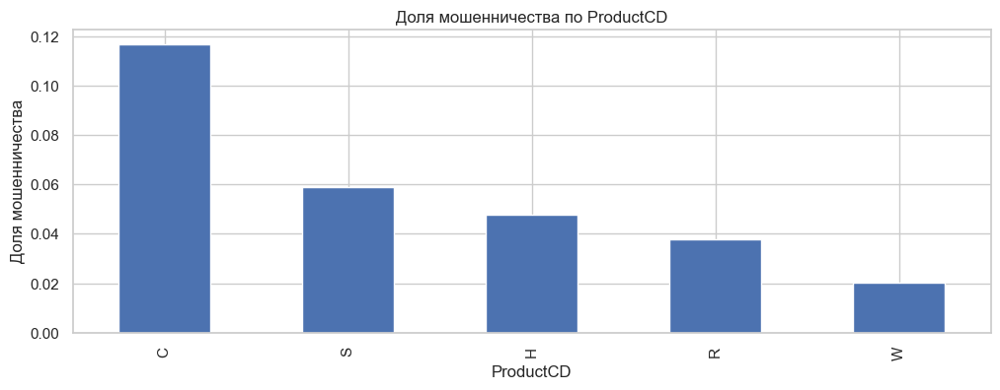

In [26]:
col = 'ProductCD'
show_feature_details(train, col)

#### 1. Распределение транзакций по ProductCD
- Большинство транзакций относятся к типу **W** — **74.45%** всех операций.
- На втором месте — **C** (**11.60%**), затем идут **R** (**6.38%**), **H** (**5.59%**) и **S** (**1.97%**).
- Категория **unknown** отсутствует (0%).

**Вывод**: транзакции крайне неравномерно распределены между различными ProductCD. Большую часть составляют операции типа **W**.

---

#### 2. Доля мошенничества по ProductCD (анализ графика)
На графике показана **доля мошеннических операций** внутри каждой категории:

- **Наивысшая доля мошенничества** наблюдается у ProductCD **C** (~12%).
- Далее идут **S**, **H** и **R** — их доли мошенничества постепенно уменьшаются.
- У **W**, несмотря на огромное количество транзакций, **доля мошенничества минимальна** (~2%).
- Для **unknown** доля мошенничества равна нулю.

**Вывод**:
- Типы продуктов **C**, **S**, **H** и **R** более подвержены мошенничеству, чем **W**.
- Особенно стоит обратить внимание на **C** — хотя он встречается реже, риск мошенничества в нём высокий.
- **W** — массовый продукт с наименьшим риском мошенничества.

---

#### 3. Итого:
- При построении модели для предсказания мошенничества можно учитывать категорию **ProductCD** как важный признак.
- Категории с высокой долей мошенничества (**C**, **S**) могут иметь повышенный вес или более строгую проверку.
- Категории с низкой долей мошенничества (**W**) могут снижать вероятность классификации транзакции как мошеннической.

### Анализ признака  card1

In [27]:
train['card1'].unique()

[13926, 2755, 4663, 18132, 4497, ..., 7236, 17972, 13166, 8767, 18038]
Length: 13553
Categories (13553, int64): [1000, 1001, 1004, 1005, ..., 18391, 18393, 18395, 18396]


Анализ признака: card1
card1
7919     0.025285
9500     0.023981
15885    0.017545
17188    0.017516
15066    0.013454
12695    0.012008
12544    0.011469
6019     0.011466
2803     0.010399
7585     0.009032
Name: proportion, dtype: float64


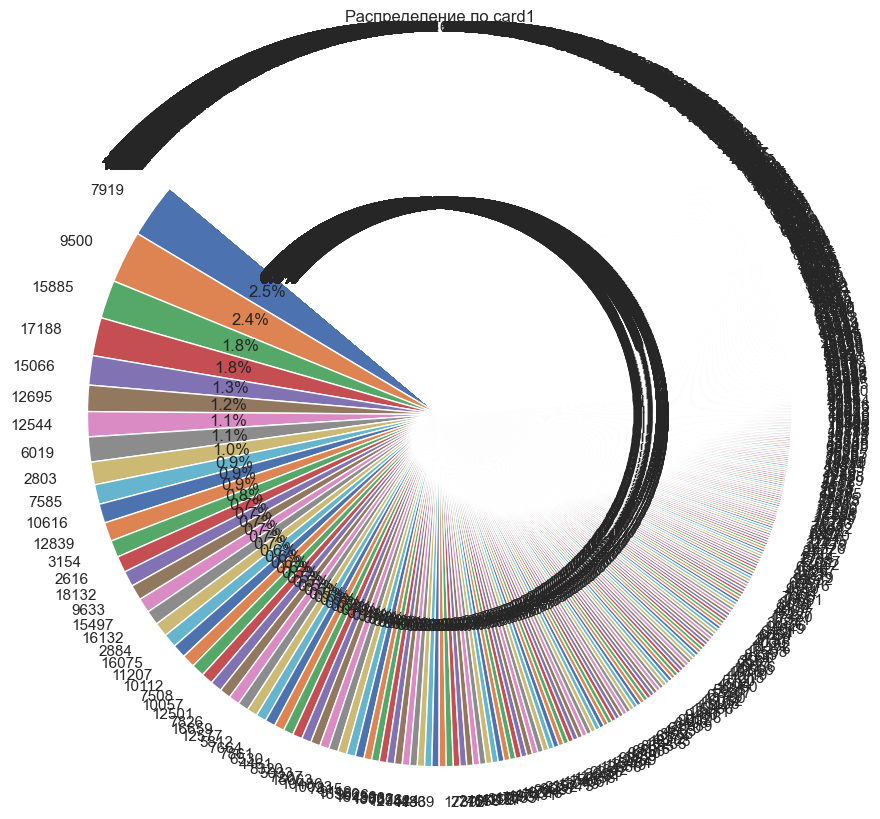

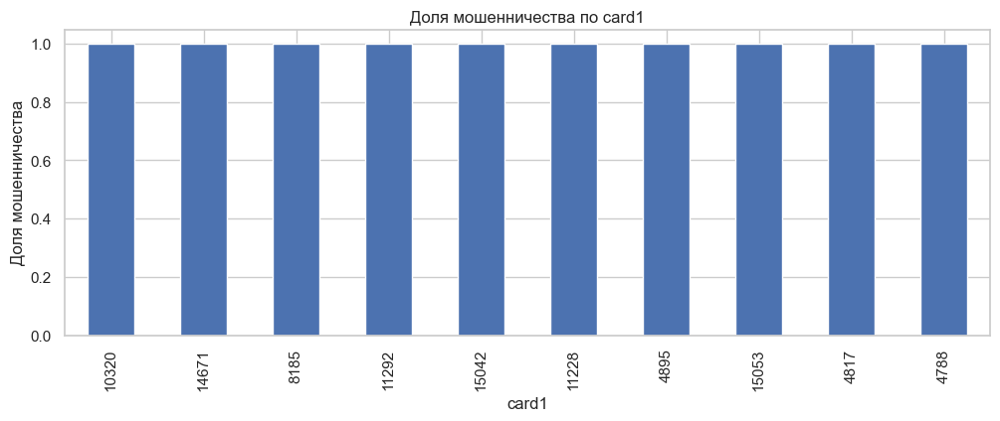

In [28]:
col = 'card1'
show_feature_details(train, col)

### Анализ графика "Доля мошенничества по card1"

1. **Равномерная доля мошенничества:**
   - График показывает, что доля мошеннических транзакций для каждой из представленных карт примерно одинакова. Это указывает на отсутствие явных аномалий или специфичных карт с высоким уровнем риска.

2. **Визуальное различие:**
   - Незначительные различия между картами указывают на то, что по этому признаку не удастся точно выделить мошеннические действия.

3. **Интерпретация данных:**
   - Это может свидетельствовать о том, что `card1` как отдельный признак не является сильным индикатором мошенничества. Необходимо комбинировать его с другими признаками для повышения эффективности модели.

4. **Нет доминирующих аномалий:**
   - Отсутствие резкого пика говорит о том, что ни одна из категорий `card1` не выбивается в плане анормально высокого уровня мошенничества.

### Варианты использования признака:

- **Комбинация признаков:** Исследовать сочетания `card1` с другими признаками, чтобы выявить потенциальные скрытые зависимости.
  
- **Feature Engineering:** Создать дополнительные признаки, такие как взаимодействия с другими категориями (`card2`, `addr1`, и т.д.).

- **Сегментация:** Исследовать временные изменения в доле мошенничества, что может выявить неизвестные паттерны.

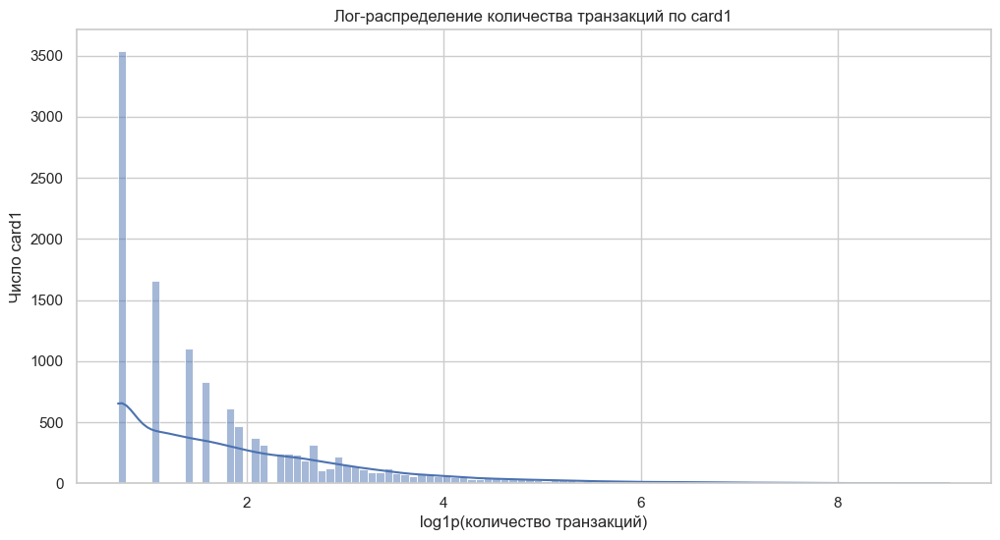

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Считаем количество транзакций по каждому card1
card1_counts = df_modified['card1'].value_counts()

# Чтобы избежать проблем с "unknown" (где 0 транзакций)
card1_counts = card1_counts[card1_counts > 0]

# Логарифмируем количество транзакций для более наглядного графика
plt.figure(figsize=(12, 6))
sns.histplot(np.log1p(card1_counts), bins=100, kde=True)
plt.title('Лог-распределение количества транзакций по card1')
plt.xlabel('log1p(количество транзакций)')
plt.ylabel('Число card1')
plt.grid(True)
plt.show()


### Выводы по графику лог-распределения количества транзакций по `card1`

1. **Сильная скошенность влево:**
   - Большинство карт имеет небольшое количество транзакций, что типично для распределений с длинным хвостом.

2. **Длинный хвост:**
   - Небольшое количество карт используется очень активно, что может указывать на определенные поведенческие паттерны или риск мошенничества.

3. **Аномалии в активности:**
   - Карты с чрезмерно высоким числом транзакций могут быть исследованы на предмет аномального или подозрительного поведения.

4. **Требуется дополнительное исследование:**
   - Важно проанализировать временные и контекстуальные аспекты использования этих карт, чтобы лучше понять природу активности и связанный с ней риск.

5. **Разработка признаков:**
   - Возможно создание новых признаков, таких как "частота транзакций", для повышения точности моделей анти-фрода.

### Анализ признака card2


Анализ признака: card2
card2
321.0    0.084138
111.0    0.077700
555.0    0.072205
490.0    0.065586
583.0    0.037488
170.0    0.031317
194.0    0.029123
545.0    0.028120
360.0    0.026117
514.0    0.025001
Name: proportion, dtype: float64


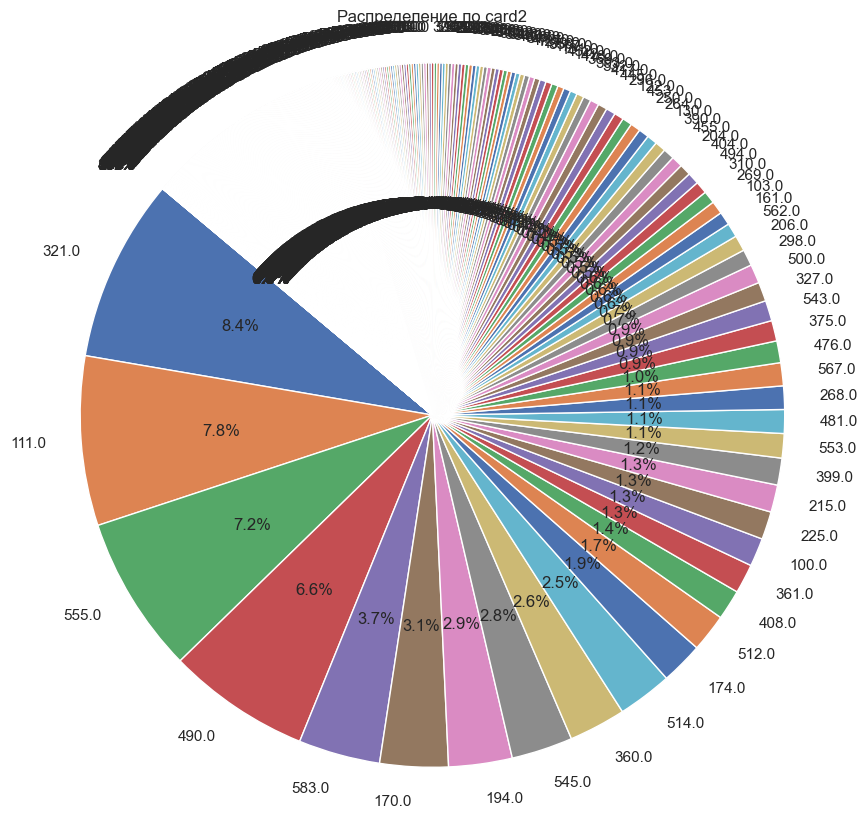

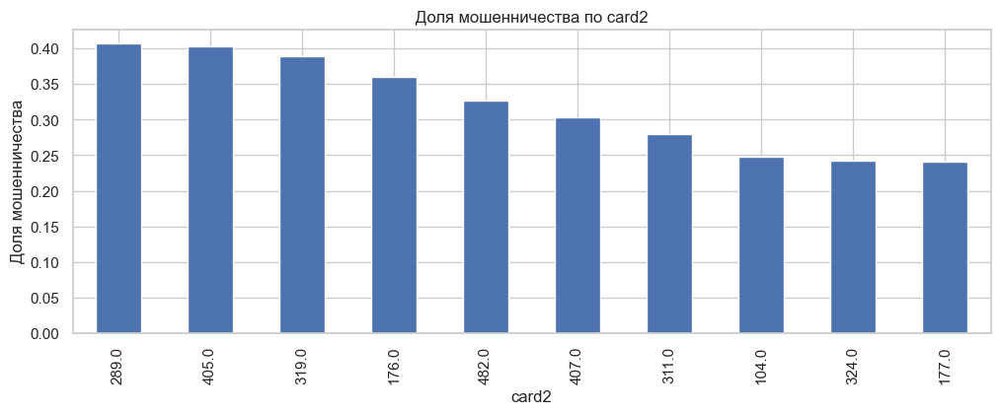

In [30]:
col = 'card2'
show_feature_details(train, col)

### Анализ графика "Доля мошенничества по card2"

1. **Различия в доле мошенничества:**
   - Карты с кодами `card2`, такими как 289.0 и 405.0, имеют более высокую долю мошенничества по сравнению с другими. Это указывает на возможные рисковые категории.

2. **Вариативность данных:**
   - Наблюдается значительное различие в доле мошенничества между различными значениями `card2`. Это различие может помочь в идентификации карт с высоким риском мошенничества.

3. **Выявление аномалий:**
   - Высокая доля мошенничества для некоторых значений может указывать на возможность целенаправленных атак или повышенного фокуса мошенников на этих картах.

4. **Использование в моделировании:**
   - Значения `card2` с высокой долей мошенничества можно использовать как индикаторы "красного флага" для автоматического мониторинга и фильтрации подозрительных транзакций.

### Варианты использования признака:

  - Провести анализ транзакций по указанным категориям, чтобы понять причину высокого уровня мошенничества.
  - Использовать данную информацию в качестве значимого признака для классификационных моделей, чтобы повысить точность предсказания мошенничества.

### Анализ признака card3


Анализ признака: card3
card3
150.0    0.885075
185.0    0.095668
106.0    0.002667
144.0    0.002126
146.0    0.002126
117.0    0.001633
143.0    0.001526
119.0    0.001273
102.0    0.000781
147.0    0.000662
Name: proportion, dtype: float64


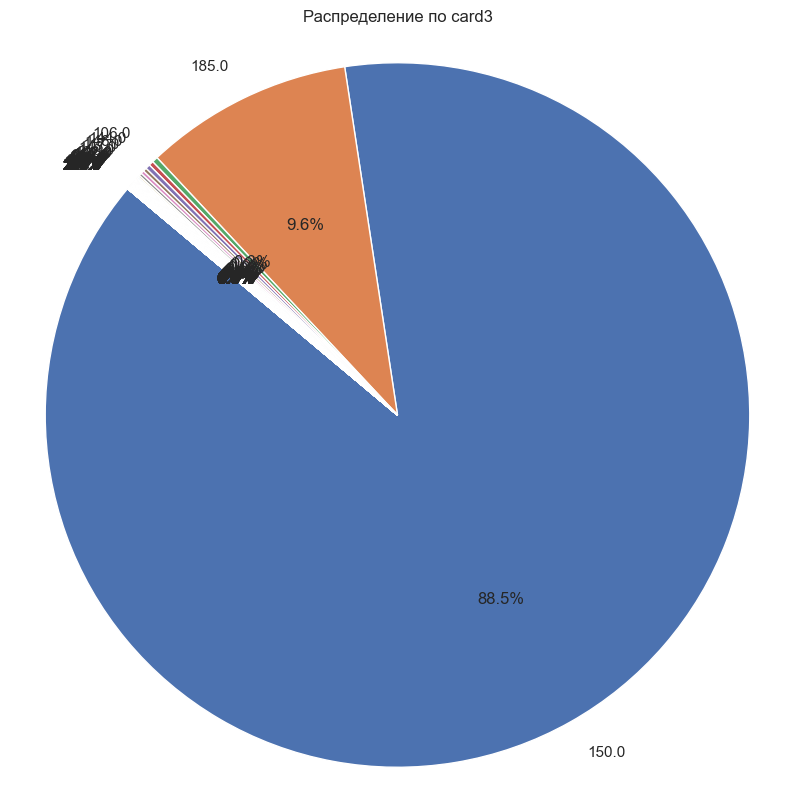

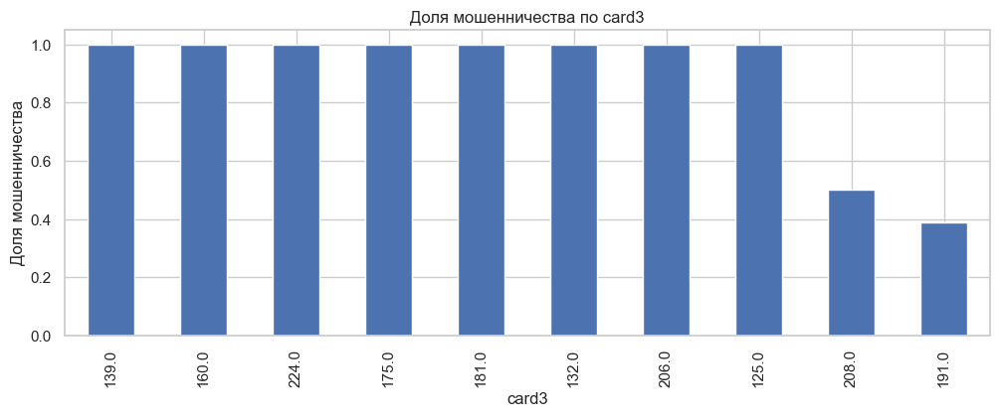

In [31]:
col = 'card3'
show_feature_details(train, col)

### Анализ графика признака `card3`

1. **Высокая доля мошенничества:**
   - На графике видно, что несколько значений `card3` (такие как 132.0, 160.0, 175.0 и другие) имеют значительные доли мошенничества, близкие к 1. Это делает их важными для анализа риска.

2. **Потенциальные аномалии:**
   - Значения с высокой долей мошенничества могут указывать на либо целенаправленные атаки, либо на фальшивые карты. Стоит провести более детальное исследование таких транзакций.

3. **Сравнение с распространенностью:**
   - Несмотря на то что 150.0 занимает подавляющую часть транзакций (88%), в данном графике анализируются значения, возможно, реже встречающиеся, но более подозрительные.

4. **Важно для включения в модель:**
   - Эти данные могут быть полезны для моделирования мошенничества; важно убедиться, что эти категории включены как важные признаки в алгоритмы машинного обучения.

### Варианты использования признака:

  - Провести исследование транзакций по выявленным значениям с высокой долей мошенничества, чтобы выявить возможные причины.
  - Интегрировать те значения `card3`, которые показывают повышенный уровень риска, для повешения точности моделей прогнозирования мошенничества.


### Анализ признака  card4


Анализ признака: card4
card4
visa                0.653296
mastercard          0.321271
american express    0.014140
discover            0.011293
Name: proportion, dtype: float64


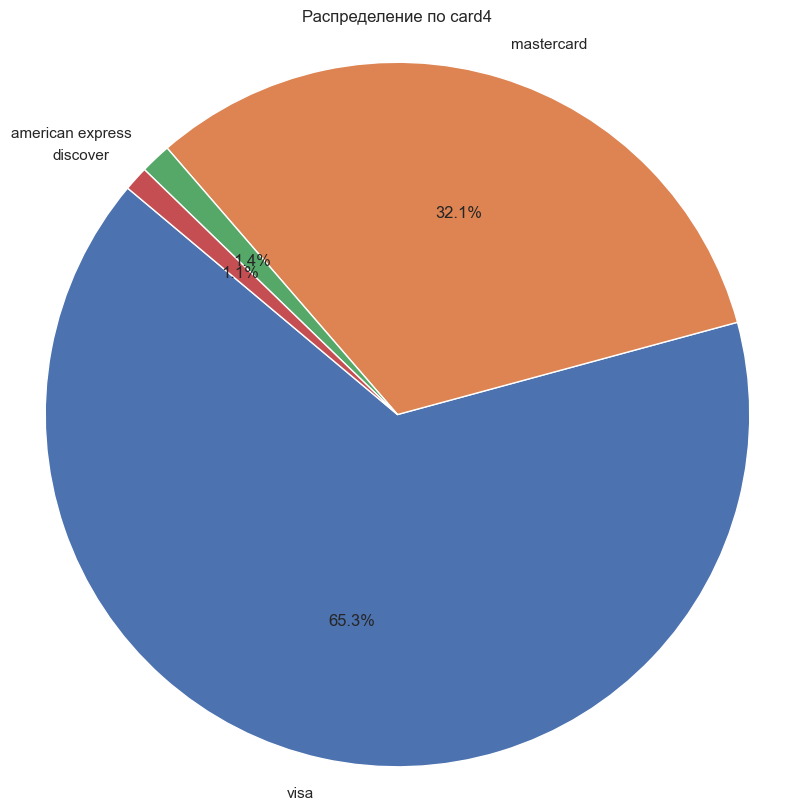

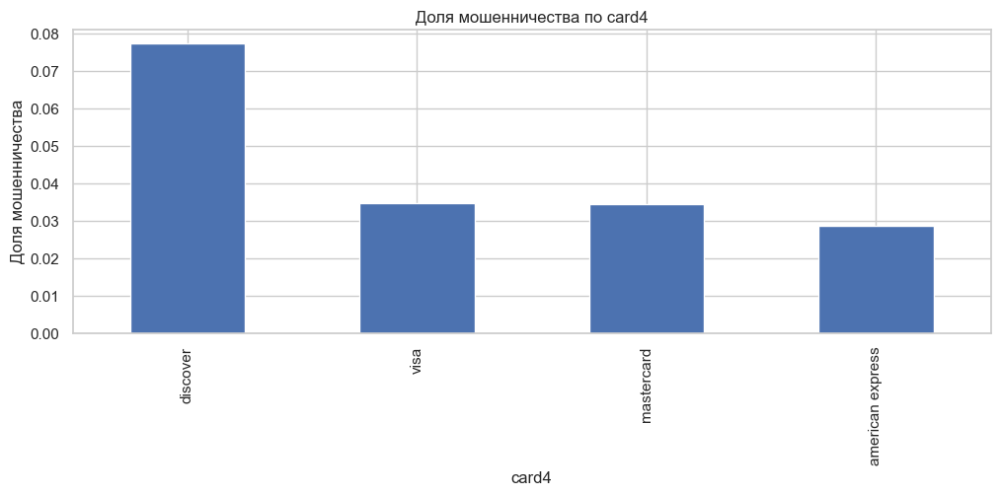

In [32]:
col = 'card4'
show_feature_details(train, col)

### Анализ графика признака `card4`

1. **Доля мошенничества:**
   - Карты `discover` имеют самую высокую долю мошенничества среди всех категорий. Это может указывать на более высокий риск или целенаправленные атаки, связанные с этим типом карт.

2. **Чаще используемые карты:**
   - Хотя `visa` и `mastercard` занимают наиболее значимую долю транзакций (65% и 32% соответственно), их доля мошенничества ниже, чем у `discover`.

3. **Риск для менее распространенных карт:**
   - `American Express` и `unknown` имеют более низкие доли в данных, но их уровни мошенничества также значимы, что указывает на необходимость внимательного мониторинга.

### Варианты использования признака:

  - Продолжать анализировать транзакции по категориям, а также исследовать возможные причины высоких уровней мошенничества для некоторых типов карт (discovered).
  - Использовать категориальный признак `card4` в предсказательных моделях для повышения точности прогноза мошенничества.

### Анализ признака card5


Анализ признака: card5
card5
226.0    0.505809
224.0    0.139034
166.0    0.097462
102.0    0.049643
117.0    0.044247
138.0    0.033665
195.0    0.028903
137.0    0.019990
126.0    0.017565
219.0    0.016927
Name: proportion, dtype: float64


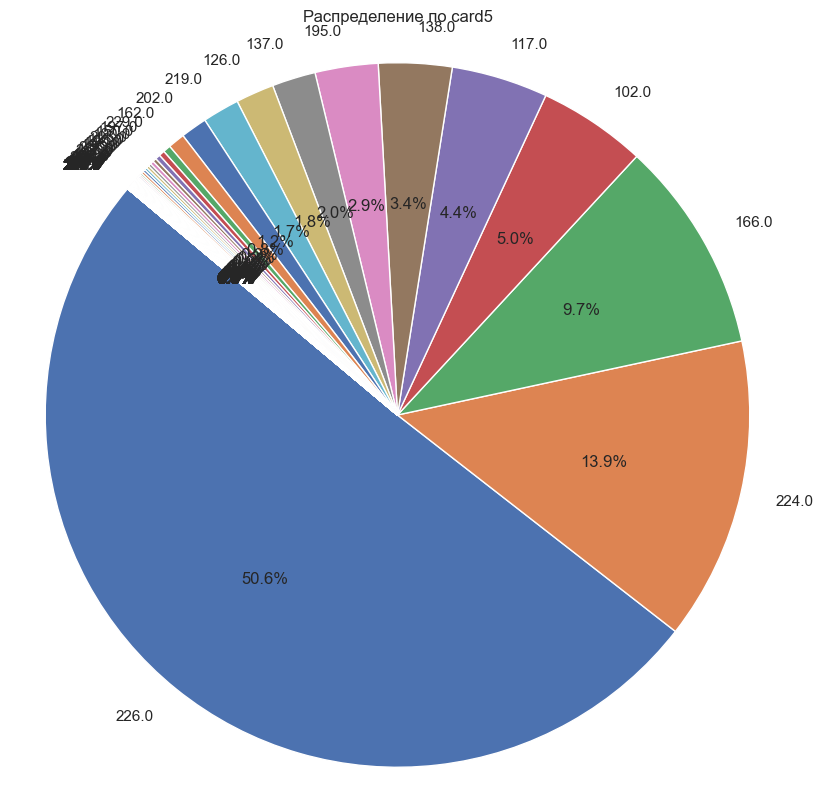

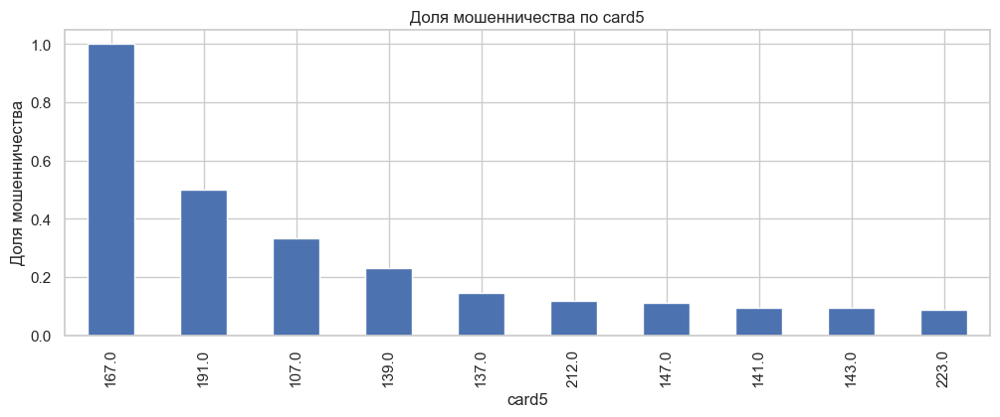

In [33]:
col = 'card5'
show_feature_details(train, col)

### Анализ графика признака `card5`

1. **Значительное распространение:**
   - Наиболее распространенное значение для `card5` — это `226.0`, составляющее более половины всех записей. Такой перекос может затруднять анализ менее распространенных значений.

2. **Высокий уровень мошенничества:**
   - Значения `167.0` и `191.0` имеют высокую долю мошенничества, близкую к 1 (> 0.5) , что может указывать на значительную уязвимость или дополнительные признаки аномальной активности.

3. **Разнообразие в долях:**
   - График показывает, что доля мошенничества значительно варьируется между разными значениями `card5`, что можно использовать для выделения критичных для анализа категорий.

### Варианты использования признака:

  - Провести детальное исследование транзакций с `card5` значениями 167.0 и 191.0, чтобы определить возможные уязвимости или шаблоны, объясняющие высокий уровень риска.
  - Включить разнообразие долей мошенничества по `card5` в прогнозные модели для повышения их точности при обнаружении потенциальных мошенничеств.

### Анализ признака card6


Анализ признака: card6
card6
debit              0.746963
credit             0.252961
debit or credit    0.000051
charge card        0.000025
Name: proportion, dtype: float64


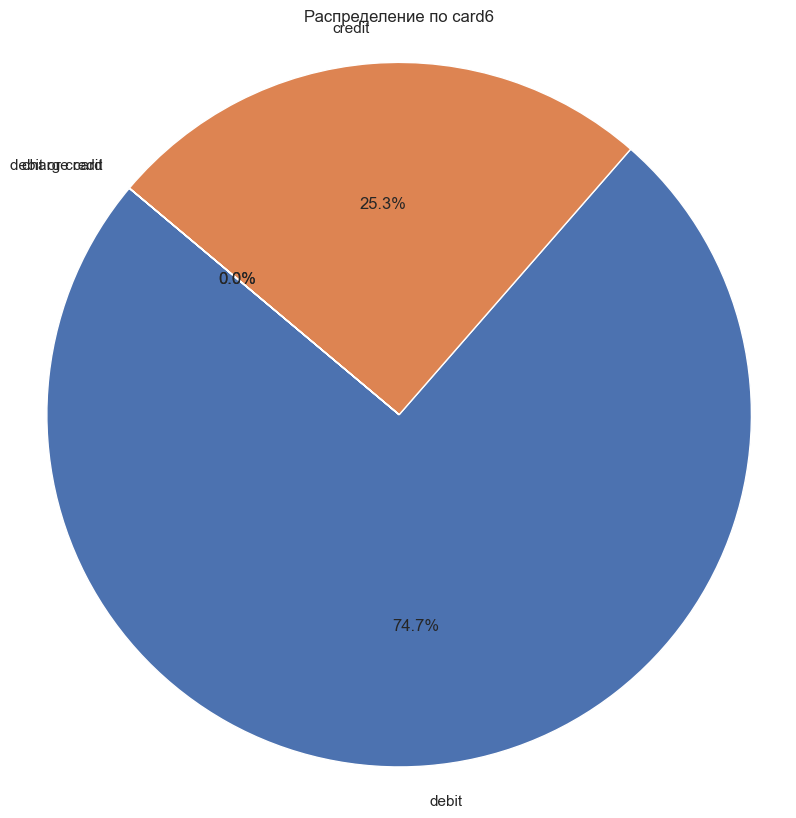

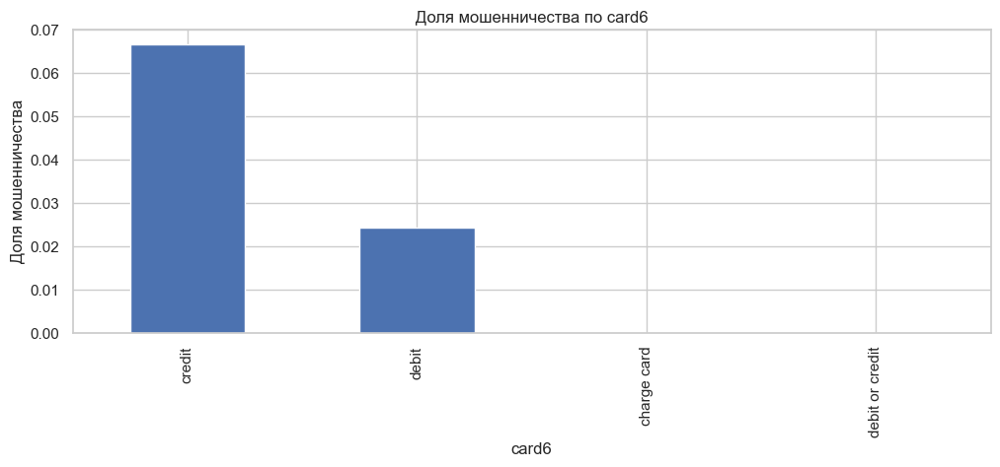

In [34]:
col = 'card6'
show_feature_details(train, col)

### Анализ графика признака `card6`

1. **Подавляющее использование дебетовых карт:**
   - Основная часть транзакций осуществляется с дебетовыми картами (около 74%), однако доля их мошенничества ниже, чем у кредитных карт.

2. **Высокий риск по кредитным картам:**
   - Кредитные карты имеют более высокую долю мошенничества. Это может быть связано с характером кредитных операций или более высокой ценностью транзакций.

3. **Неопределенные и редкие категории:**
   - Категории `unknown`, `debit or credit` и `charge card` встречаются редко. Хотя они показывают доли мошенничества, их малое количество затрудняет выводы.

### Варианты использования признака:

  - Определить происхождение и характер транзакций в категории `unknown`, чтобы улучшить анализ данных.
  - Провести детальный анализ редких категорий, чтобы понимать их потенциальные риски и принимать решения на основе полученных данных.

### Анализ признака addr1


Анализ признака: addr1
addr1
299.0    0.088285
325.0    0.081456
204.0    0.080063
264.0    0.075967
330.0    0.050086
315.0    0.043972
441.0    0.039683
272.0    0.038376
123.0    0.030686
126.0    0.029043
Name: proportion, dtype: float64


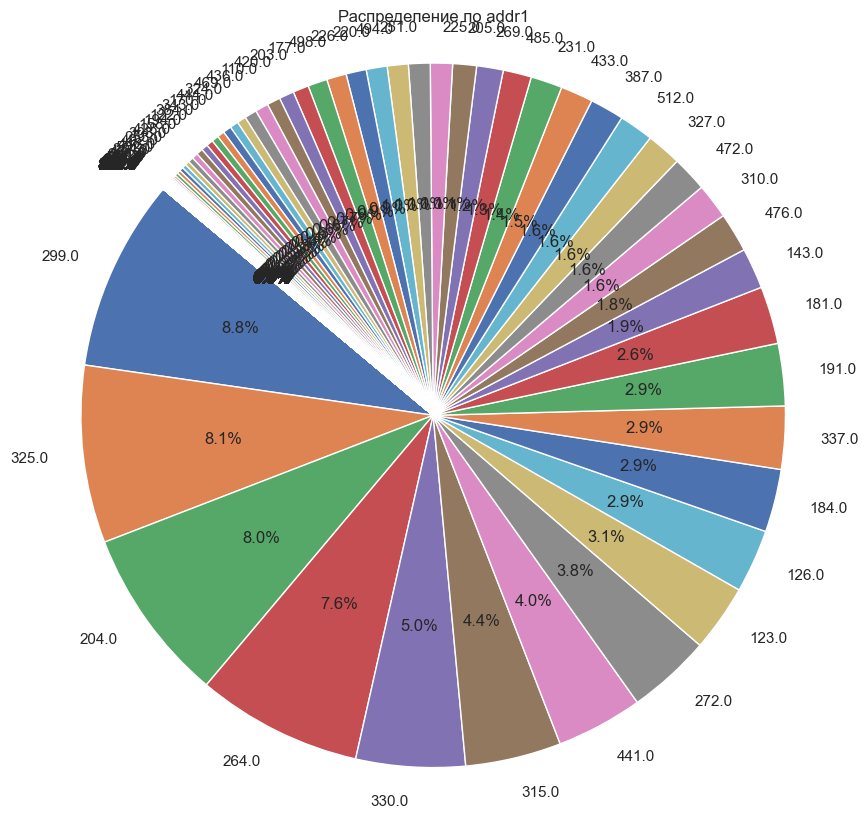

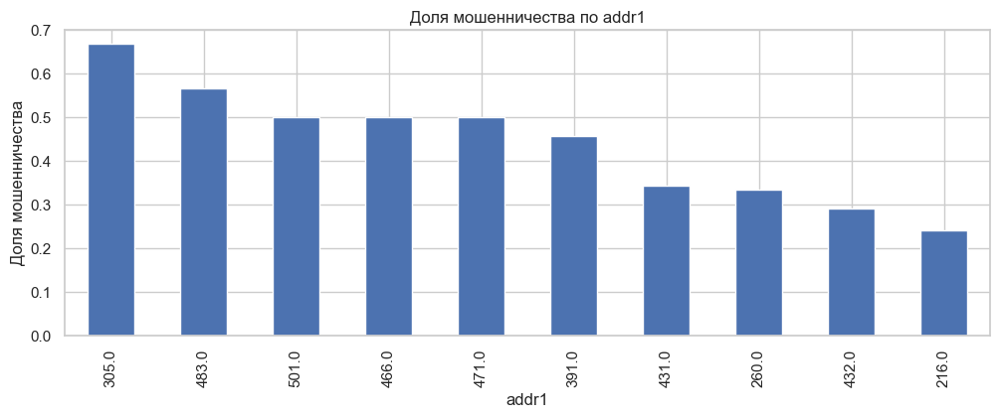

In [35]:
col = 'addr1'
show_feature_details(train, col)

### Анализ графика признака `addr1`

1. **Высокая доля мошенничества:**
   - Значения, такие как `501.0`, `260.0`, `483.0`, `305.0`, `391.0` и другие, показывают высокую долю мошенничества, что может указывать на целевые уязвимости в этих регионах или адресах.

2. **Широкий разброс:**
   - Видно, что доля мошеннических транзакций значительно варьируется в разных адресных группах, что подчеркивает значимость данного признака для анализа рисков.

3. **Категория `unknown`:**
   - Хотя "unknown" имеет значительную долю в данных, его влияние на уровень мошенничества необходимо дополнительно изучать.

### Варианты использования признака:

  - Провести детальное исследование транзакций для адресов с наибольшими рисками, чтобы выявить потенциальные причины высокой доли мошенничества.
  - Использовать `addr1` как важный признак в моделях машинного обучения для улучшения предсказания мошенничества.
  - Исследовать и, возможно, корректировать записи с адресами "unknown", чтобы избежать искажения данных и повысить точность анализа.

### Анализ признака addr2


Анализ признака: addr2
addr2
87.0    0.991706
60.0    0.005876
96.0    0.001216
32.0    0.000173
65.0    0.000156
16.0    0.000105
31.0    0.000090
19.0    0.000063
26.0    0.000048
27.0    0.000038
Name: proportion, dtype: float64


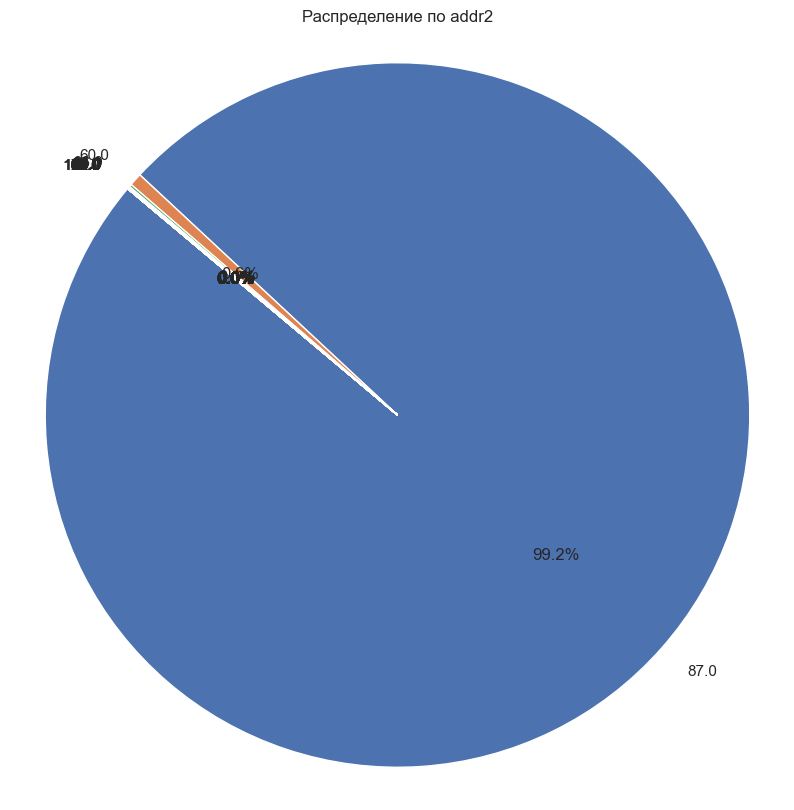

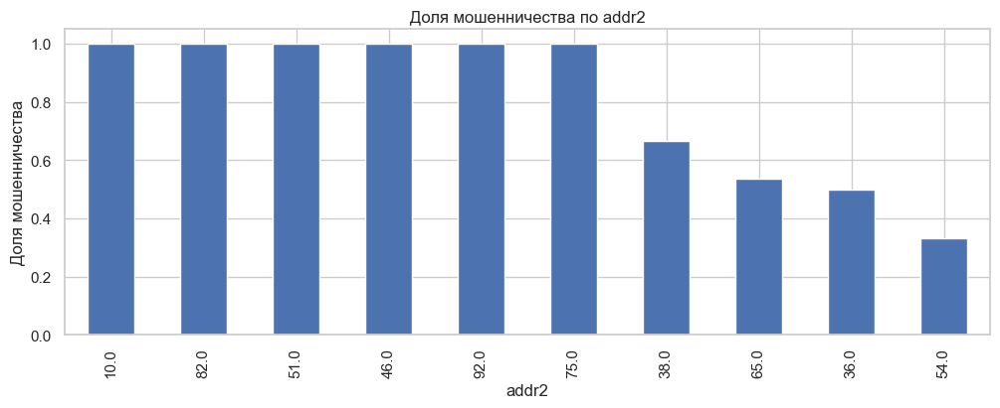

In [36]:
col = 'addr2'
show_feature_details(train, col)

### Анализ графика признака `addr2`

1. **Доминирование значения 87.0:**
   - Значение `87.0` составляет около 88% всех записей, что указывает на значительную концентрацию в определенном регионе или области. Это может затруднять выявление других паттернов.

2. **Высокая доля мошенничества:**
   - Значения, такие как `10.0`, `92.0` и другие, демонстрируют высокую долю мошеннических транзакций, близкую к 1, что может свидетельствовать о целенаправленных атаках на эти регионы.

### Варианты использования признака:
  - Провести дополнительное исследование транзакций из адресов с самыми высокими уровнями мошенничества, чтобы выявить возможные причины.
  - Поскольку `87.0` занимает значительную долю, оценить, почему именно это значение столь распространено и как оно влияет на общие паттерны данных.
  - Включить явный дисбаланс в `addr2` при построении моделей для понимания рисков и потенциальных угроз.

### Анализ признака P_emaildomain


Анализ признака: P_emaildomain
P_emaildomain
gmail.com        0.460315
yahoo.com        0.203462
hotmail.com      0.091214
anonymous.com    0.074580
aol.com          0.057025
comcast.net      0.015901
icloud.com       0.012633
outlook.com      0.010272
msn.com          0.008249
att.net          0.008130
Name: proportion, dtype: float64


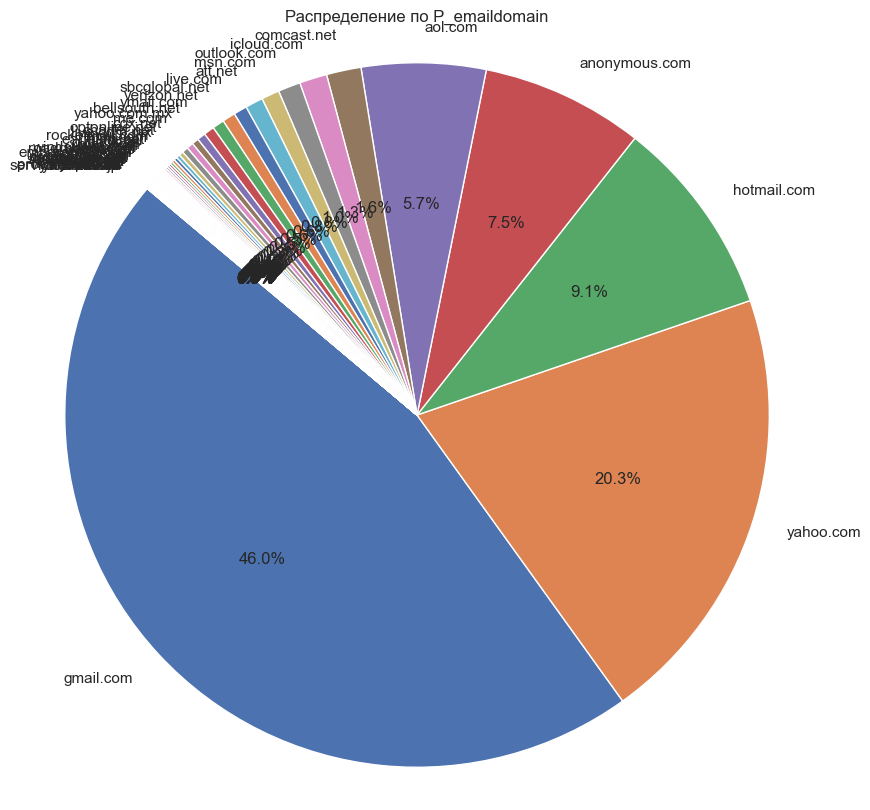

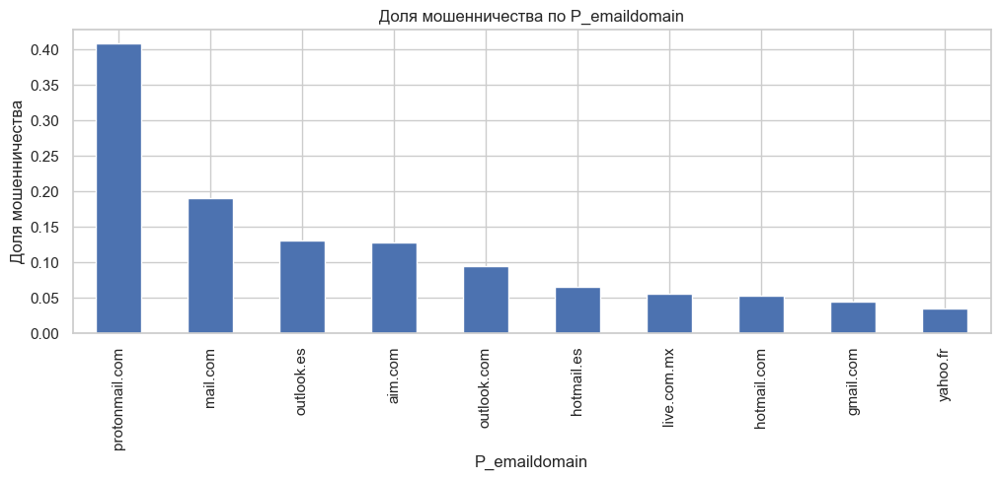

In [37]:
col = 'P_emaildomain'
show_feature_details(train, col)

### Анализ графика признака `P_emaildomain`

1. **Высокий уровень мошенничества у определённых провайдеров:**
   - `protonmail.com` имеет наивысшую долю мошенничества среди доменов, что может указывать на его популярность среди злоумышленников.

2. **Распространённые домены:**
   - `gmail.com` и `yahoo.com` являются самыми распространёнными доменами, но их доля мошенничества намного ниже, по сравнению с другими доменами.

3. **Роль "unknown":**
   - Категория `unknown` составляет значительную часть данных, и её влияние на общие паттерны неясно, что требует дополнительного изучения.

### Варианты использования признака:

  - Исследовать записи с `unknown` доменами для понимания их природы и потенциальных рисков.

### Анализ признака  R_emaildomain


Анализ признака: R_emaildomain
R_emaildomain
gmail.com        0.416247
hotmail.com      0.200370
anonymous.com    0.149529
yahoo.com        0.086255
aol.com          0.026957
outlook.com      0.018260
comcast.net      0.013198
yahoo.com.mx     0.010984
icloud.com       0.010183
msn.com          0.006206
Name: proportion, dtype: float64


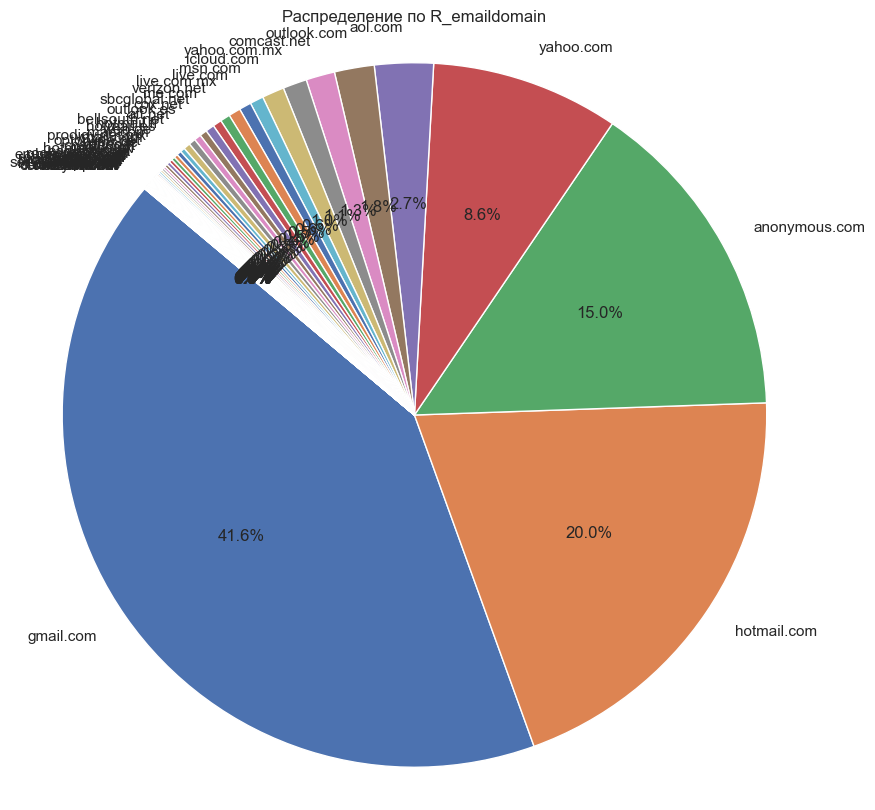

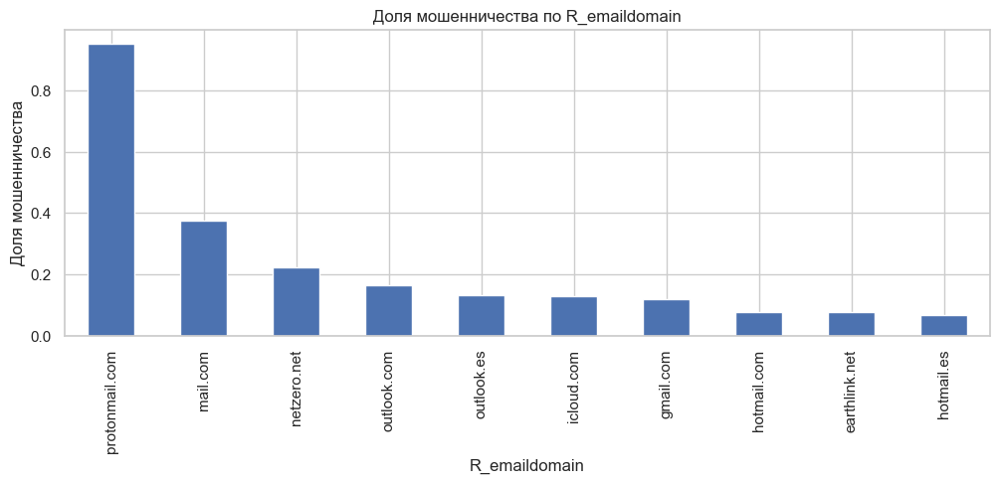

In [38]:
col = 'R_emaildomain'
show_feature_details(train, col)

### Анализ графика признака `R_emaildomain`

1. **Высокая доля "unknown":**
   - Категория `unknown` доминирует (76.7%) среди записей, что указывает на недостаток информации о получателе в большинстве транзакций. Это затрудняет анализ распределения остальных категорий.

2. **Высокая доля мошенничества у `protonmail.com`:**
   - `protonmail.com` имеет наибольшую долю мошенничества, что требует внимания и возможно, повышенного мониторинга таких транзакций.

3. **Низкое распределение по другим категориям:**
   - Очень малая доля пользователей на gmail.com, hotmail.com и других популярных доменах указана как получатели. Это может указывать на особенности данных или стратегию мошенников.

### Варианты использования признака:

  - Углубленный анализ данных без известных доменов может помочь понять логику транзакций и выявить скрытые риски.
  - Изучить транзакции с известными, но менее представленными доменами и понять их роль в общем контексте.

### Анализ признака  DeviceType


Анализ признака: DeviceType
DeviceType
desktop    0.604822
mobile     0.395178
Name: proportion, dtype: float64


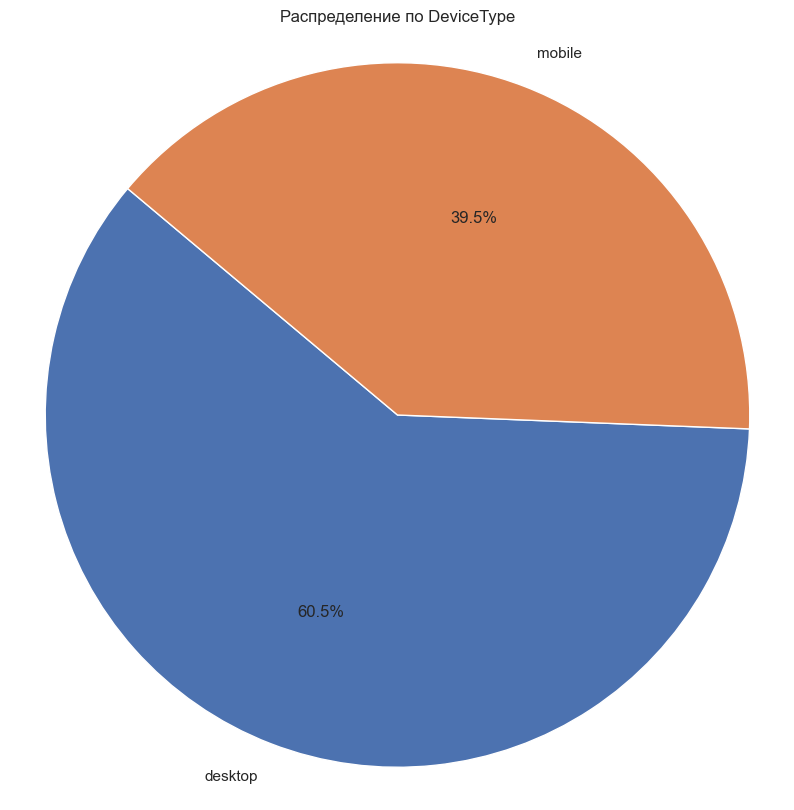

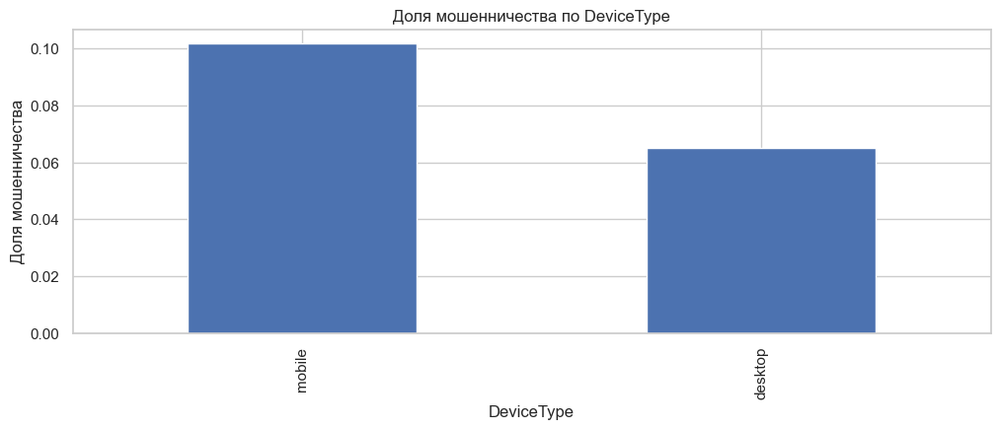

In [39]:
col = 'DeviceType'
show_feature_details(train, col)

### Анализ графика признака `DeviceType`

1. **Преобладание категории "unknown":**
   - Большинство записей (76.2%) не указывают тип устройства, что затрудняет анализ и требует дополнительной интерпретации данных.

2. **Мошенничество на мобильных устройствах:**
   - Мобильные устройства показывают более высокую долю мошенничества по сравнению с другими категориями, что может указывать на уязвимость этих устройств.

3. **Процент использования:**
   - `desktop` и `mobile` составляют меньшую долю, но все еще значимы для анализа пользовательского поведения.

### Анализ признака  DeviceInfo


Анализ признака: DeviceInfo
DeviceInfo
Windows                  0.402154
iOS Device               0.166703
MacOS                    0.105953
Trident/7.0              0.062697
rv:11.0                  0.016020
rv:57.0                  0.008107
SM-J700M Build/MMB29K    0.004626
SM-G610M Build/MMB29K    0.003885
SM-G531H Build/LMY48B    0.003455
rv:59.0                  0.003051
Name: proportion, dtype: float64


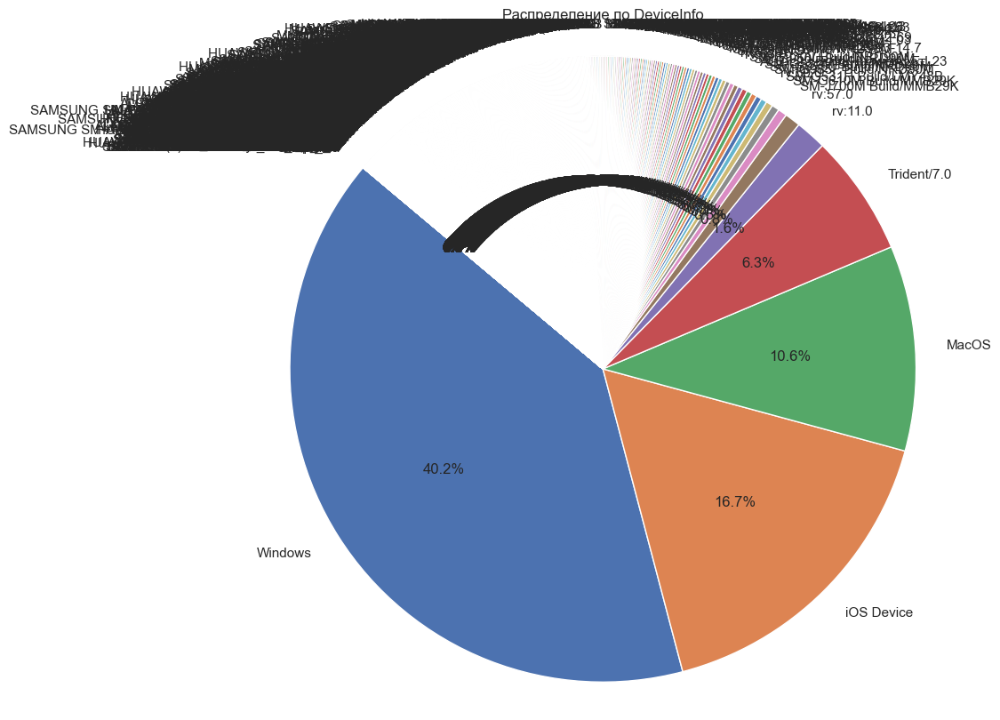

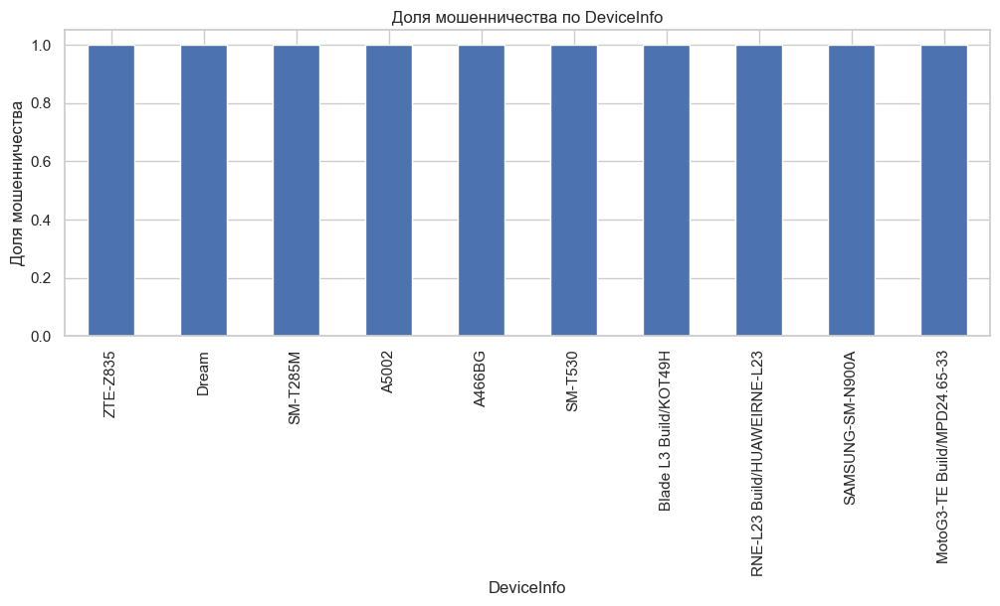

In [40]:
col = 'DeviceInfo'
show_feature_details(train, col)

### Анализ графика признака `DeviceInfo`

1. **Преобладание "unknown":**
   - Подавляющее большинство записей (79.9%) не содержат информации об устройстве, что создаёт значительную неопределённость.

2. **Высокий уровень мошенничества у отдельных устройств:**
   - Устройства, такие как `Beat`, `NOKIA`, и некоторые другие специфические модели, показывают очень высокую долю мошенничества, что требует дополнительного внимания.

3. **Доля популярных устройств:**
   - `Windows`, `iOS Device`, и `MacOS` представлены в меньшей степени, с более низким уровнем мошенничества.

### Варианты использования признака:
  - Провести подробное исследование и мониторинг устройств с высокой долей мошенничества.
  - Уменьшить кол-во типов устройст


Анализ признака: M6
M6
F    0.540994
T    0.459006
Name: proportion, dtype: float64


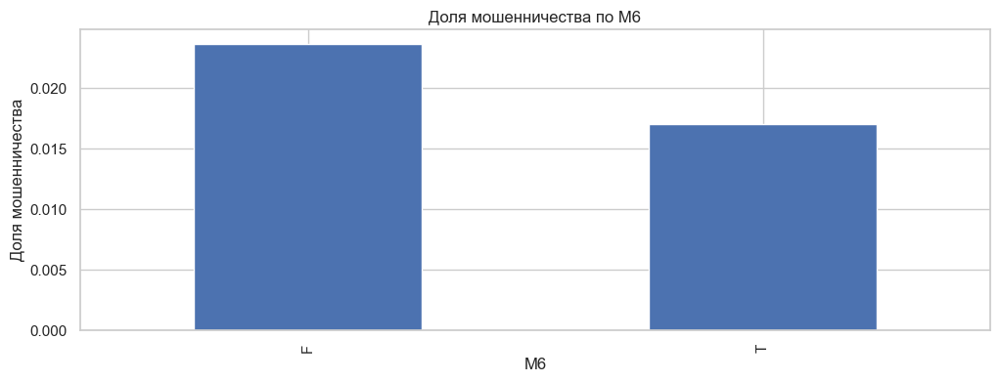

In [41]:
exclude = [
    'ProductCD', 
    'card1', 
    'card2', 
    'card3', 
    'card4', 
    'card5', 
    'card6', 
    'addr1', 
    'addr2', 
    'P_emaildomain', 
    'R_emaildomain', 
    'DeviceType',
    'DeviceInfo'
]

for col in categorical_features:
    if col in exclude:
        continue
    
    print(f'\nАнализ признака: {col}')
    print(train[col].value_counts(normalize=True).head(10))

    fraud_rate = train.groupby(col)['isFraud'].mean().sort_values(ascending=False)
    plt.figure(figsize=(12,4))
    fraud_rate.head(10).plot(kind='bar')
    plt.title(f'Доля мошенничества по {col}')
    plt.ylabel('Доля мошенничества')
    plt.show()


### 5. Анализ числовых признаков

#### Анализ признака  dist1

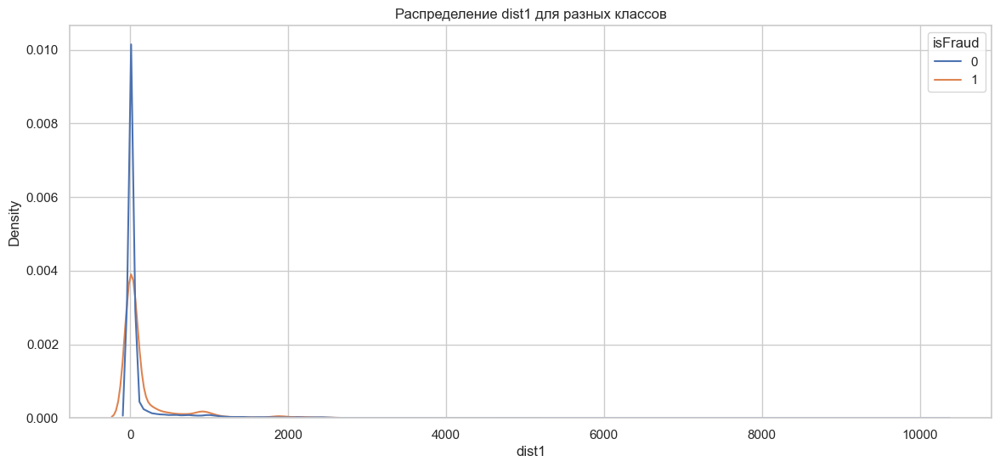

In [42]:
col = 'dist1'
plt.figure(figsize=(14,6))
sns.kdeplot(data=train, x=col, hue='isFraud', common_norm=False)
plt.title(f'Распределение {col} для разных классов')
plt.show()


### Анализ графика признака `dist1`

1. **Сосредоточенность значений:**
   - Большинство значений `dist1` сконцентрировано около 0, что отображается высоким пиком в левой части графика для обоих классов (`isFraud` = 0 и 1).

2. **Сходство распределений:**
   - Обе кривые (для мошеннических и немошеннических транзакций) имеют схожие формы и убывают относительно быстро, что указывает на распределение данных, близкое к нормальному.

3. **Редкие большие значения:**
   - Есть небольшое количество более высоких значений, растягивающее распределение вправо, что может указывать на аномальные или редкие случаи транзакций.

### Что можно сделать с признаком:

- **Дополнительный анализ редких значений:**
  - Провести исследование аномально больших значений `dist1`, чтобы выявить потенциальные риски и особенности.

- **Оценка значимости:**
  - Определить, действительно ли `dist1` является значимым признаком для выявления мошенничества в этой выборке, учитывая его схожесть для обоих классов.

#### Анализ признака  dist2

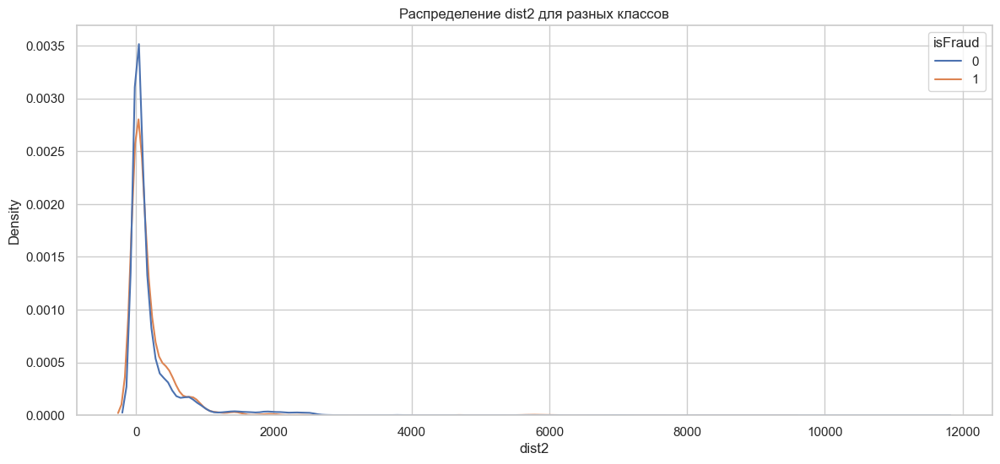

In [43]:
col = 'dist2'
plt.figure(figsize=(14,6))
sns.kdeplot(data=train, x=col, hue='isFraud', common_norm=False)
plt.title(f'Распределение {col} для разных классов')
plt.show()


### Анализ графика признака `dist2`

1. **Концентрация значений:**
   - Большинство значений `dist2` также сконцентрировано около 0, аналогично `dist1`.

2. **Схожесть распределений:**
   - Наблюдается сильное перекрытие между распределениями для мошеннических (`isFraud` = 1) и немошеннических (`isFraud` = 0) транзакций, указывая на отсутствие явных различий.

3. **Хвосты распределения:**
   - Небольшое количество более высоких значений, растягивающее распределение вправо. Это говорит о редких случаях, которые могут быть аномальными.

### Что можно сделать с признаком:

- **Анализ аномалий:**
  - Изучить редкие большие значения в `dist2`, чтобы понять, могут ли они сигнализировать о мошенничестве или ошибках.

- **Важность признака:**
  - Оценить значимость `dist2` для моделей предсказания, так как его схожесть для обоих классов может ограничивать его полезность.

### Обзор остальных признаков

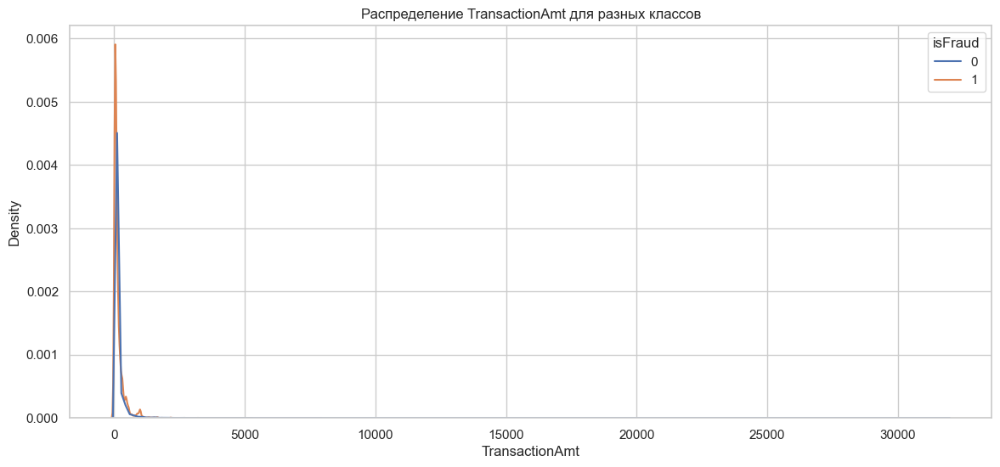

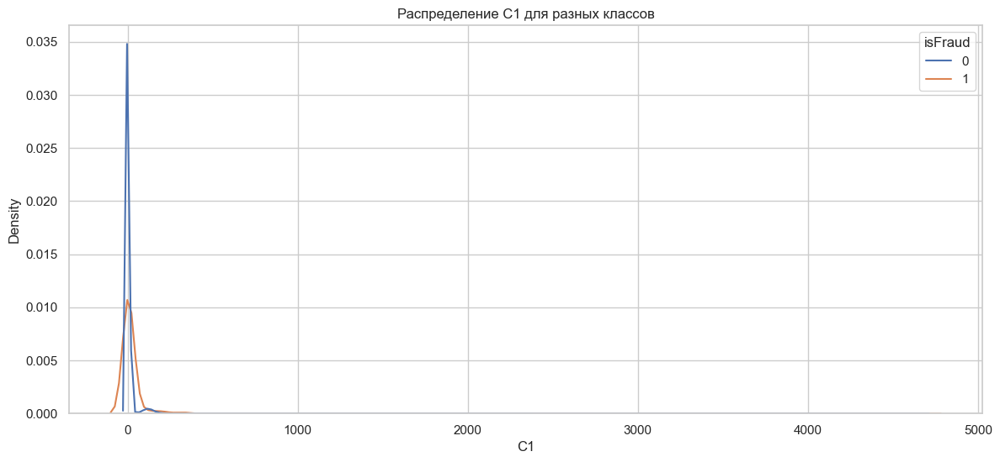

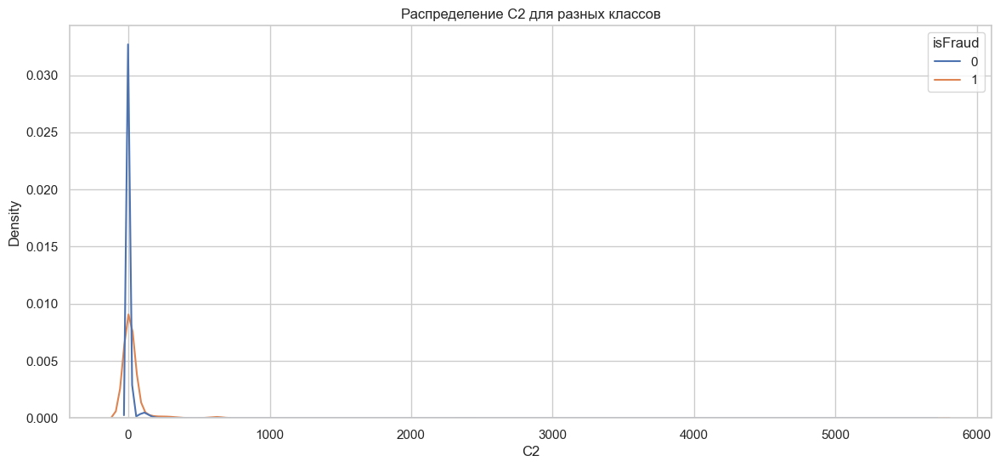

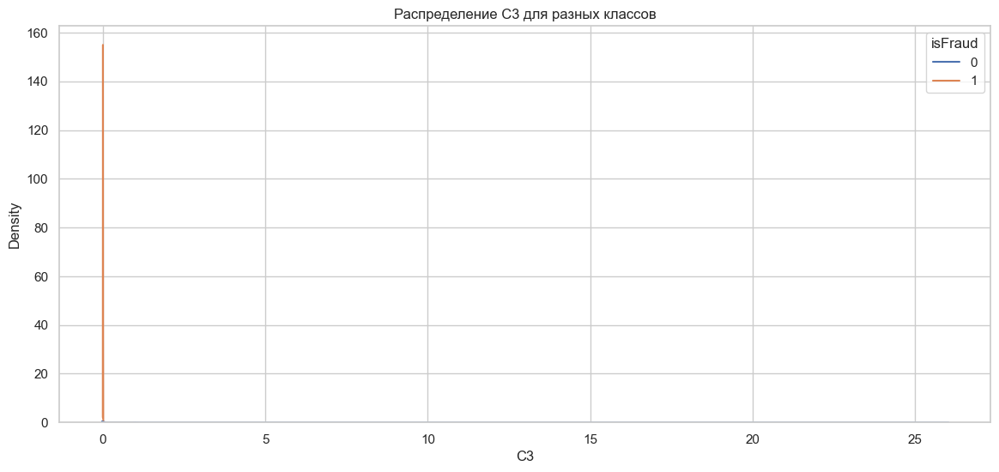

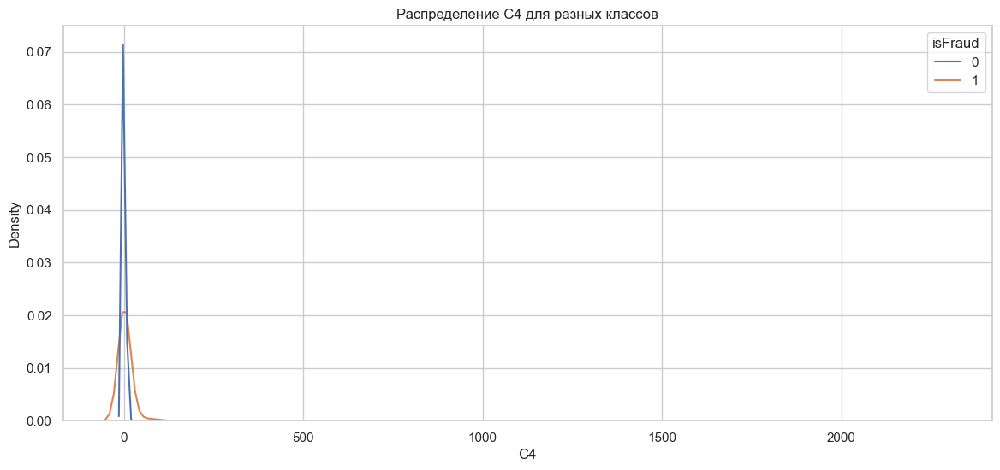

...

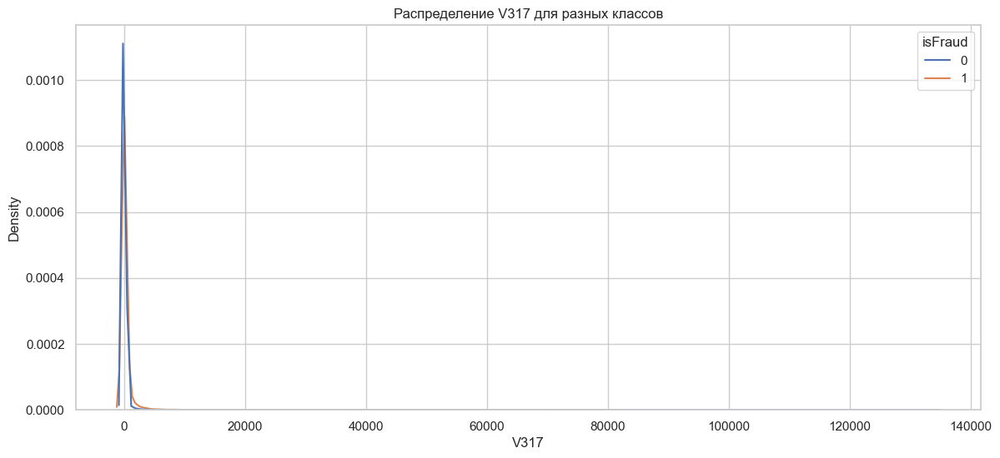

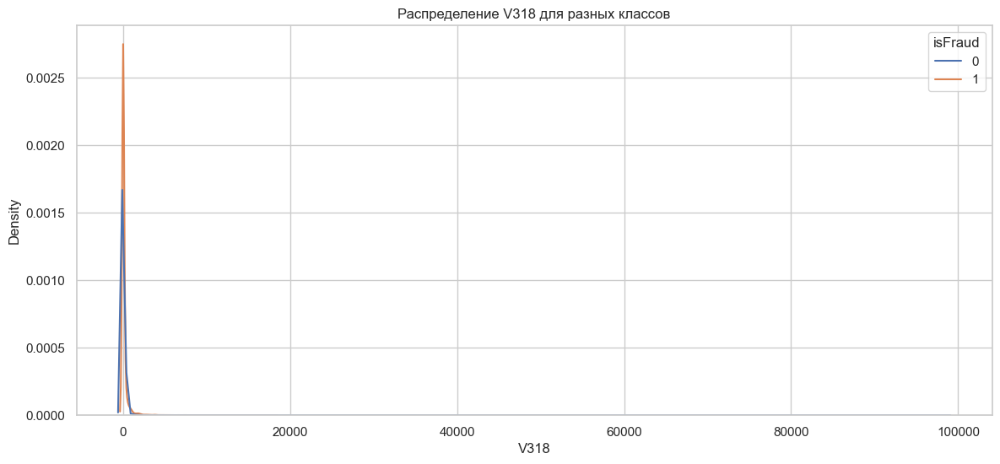

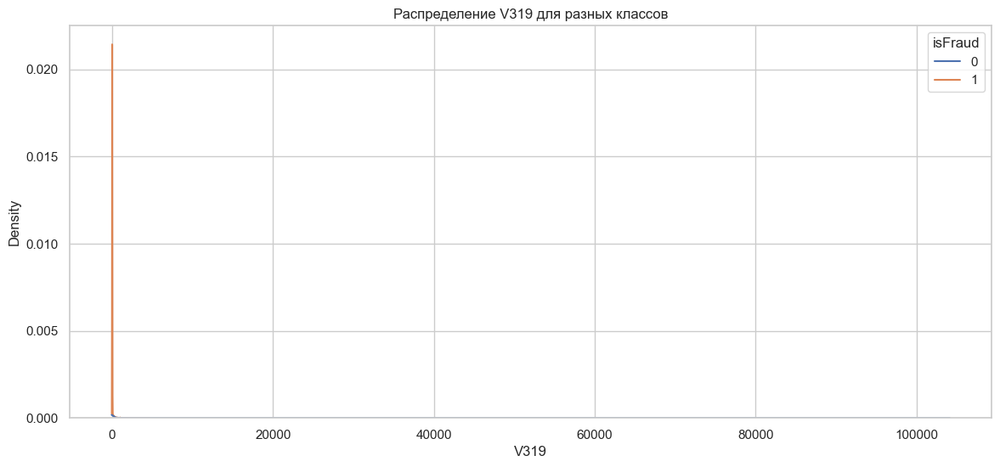

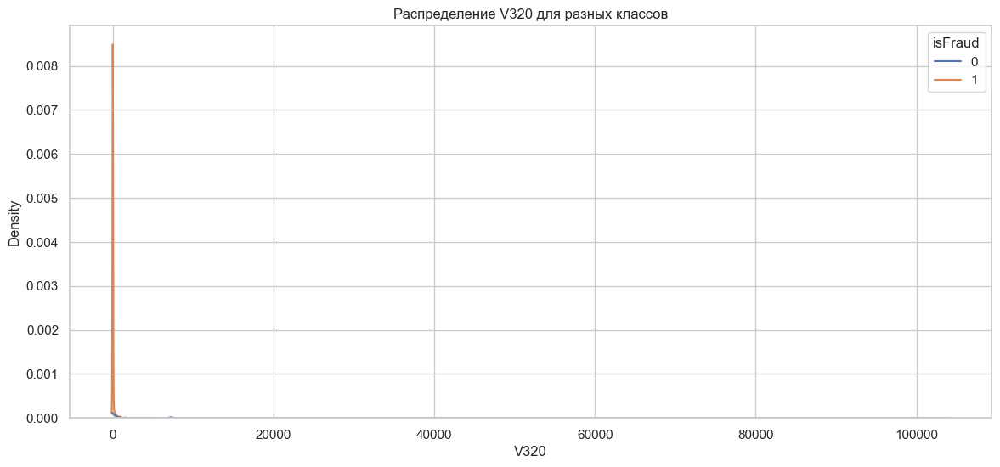

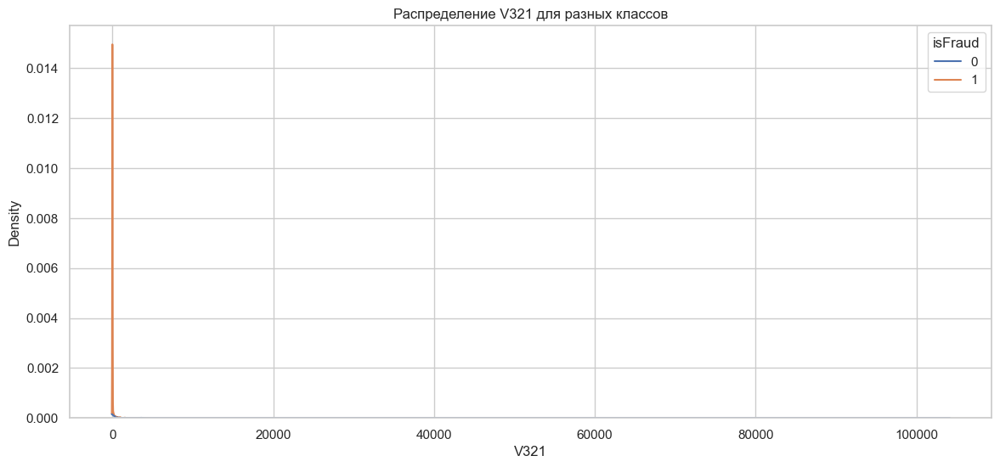

In [44]:
exclude = [
    'isFraud',
    'TransactionID',
    'TransactionDT',
    'dist1',
    'dist2', 
]

for col in numeric_features:
    if col in exclude:
        continue

    
    plt.figure(figsize=(14,6))
    sns.kdeplot(data=train, x=col, hue='isFraud', common_norm=False)
    plt.title(f'Распределение {col} для разных классов')
    plt.show()


> Если рассматривать графики в целом по всем признакам. То можно сделать вывдол что в каждом графике график класса 0 и 1 повтаряют друг друго (только с разной амплитудой и иногда с небольшим смещением)

### 6. Корреляции

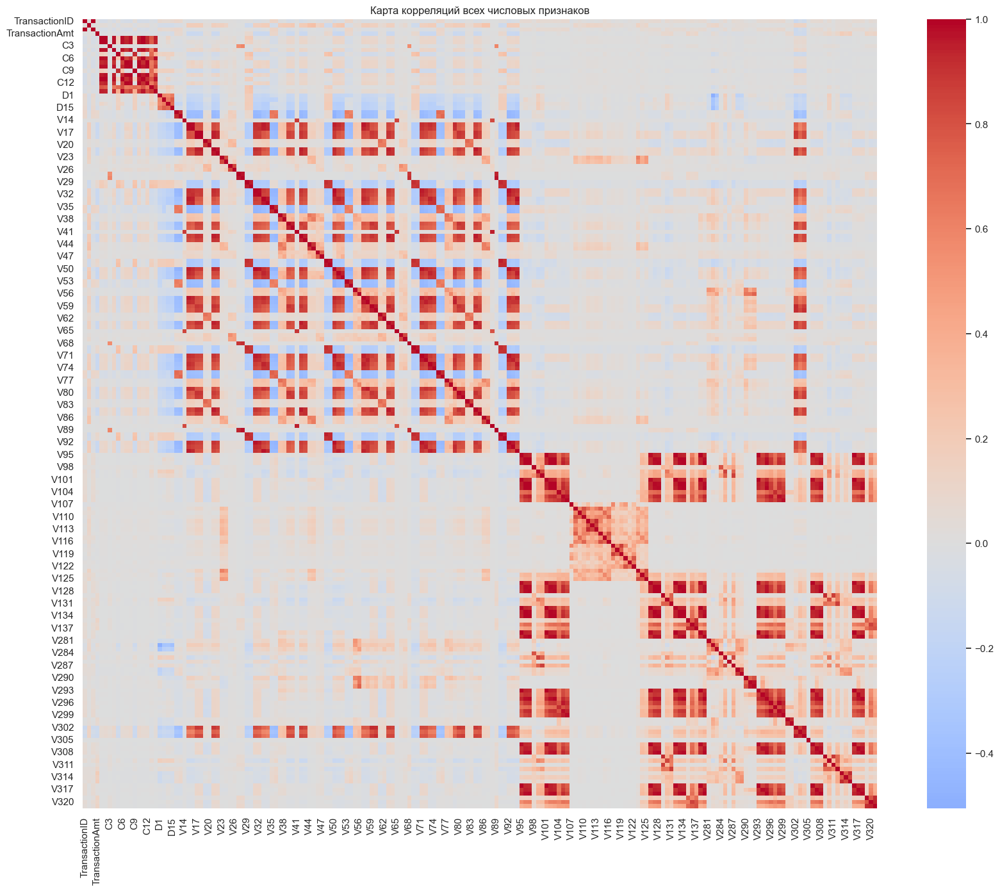

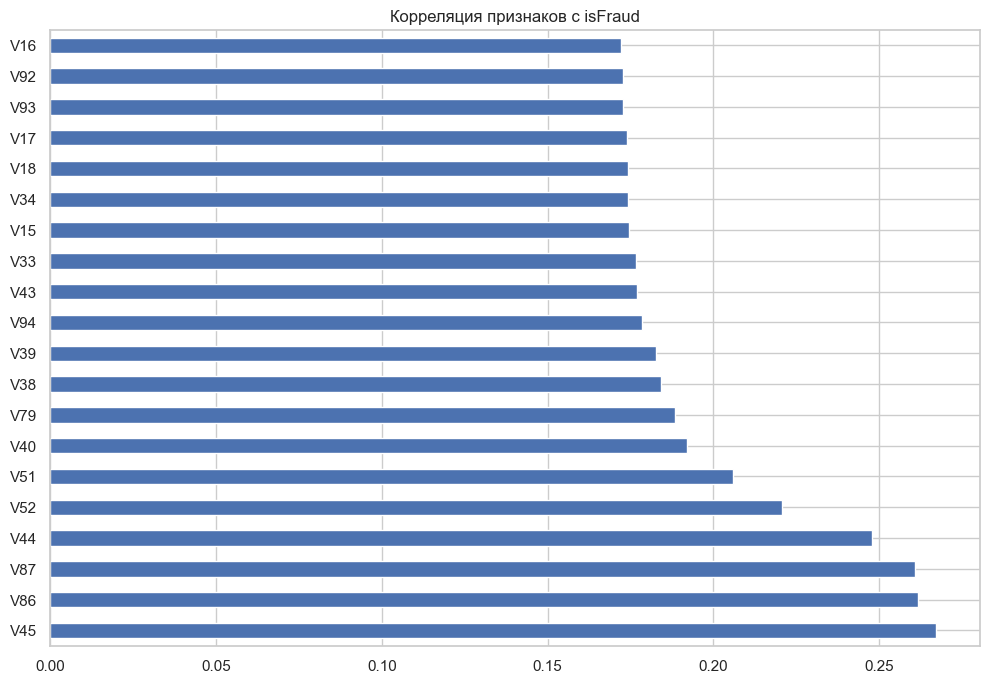

In [45]:
# Корреляционная матрица всех числовых признаков
plt.figure(figsize=(20, 16))
corr_matrix = train[numeric_features].corr()
sns.heatmap(corr_matrix, cmap='coolwarm', center=0)
plt.title('Карта корреляций всех числовых признаков')
plt.show()

# Корреляция признаков с isFraud
plt.figure(figsize=(12,8))
fraud_corr.head(20).plot(kind='barh')
plt.title('Корреляция признаков с isFraud')
plt.show()


### 7. Поиск выбросов

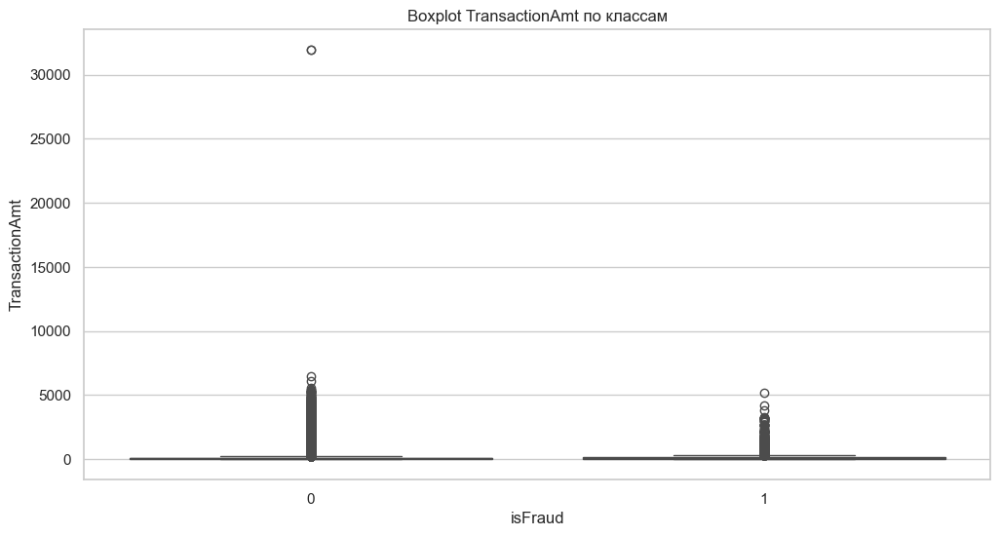

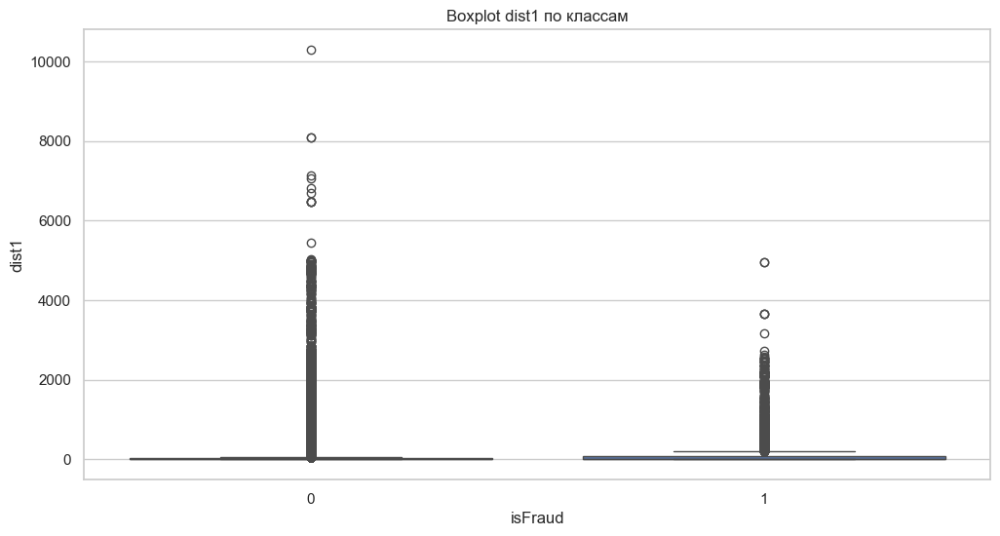

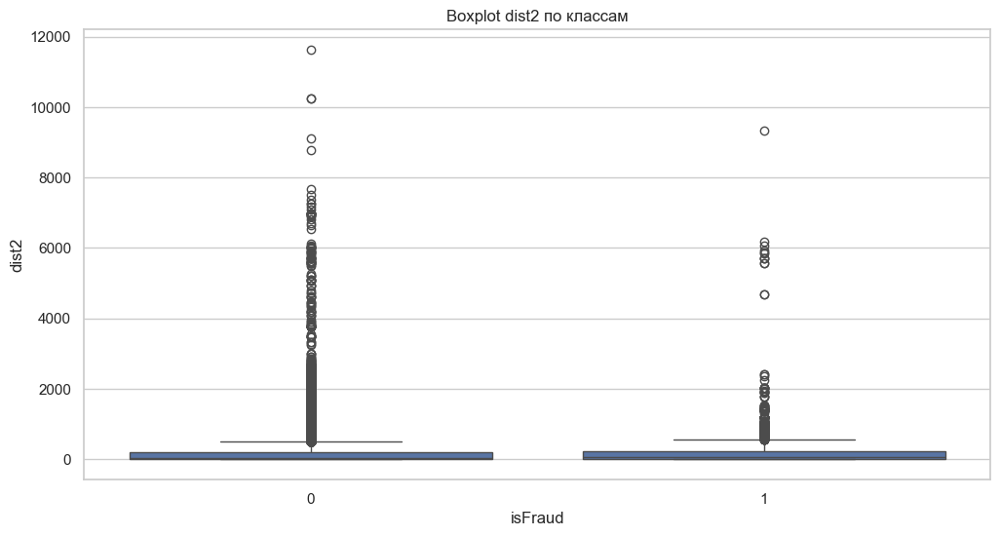

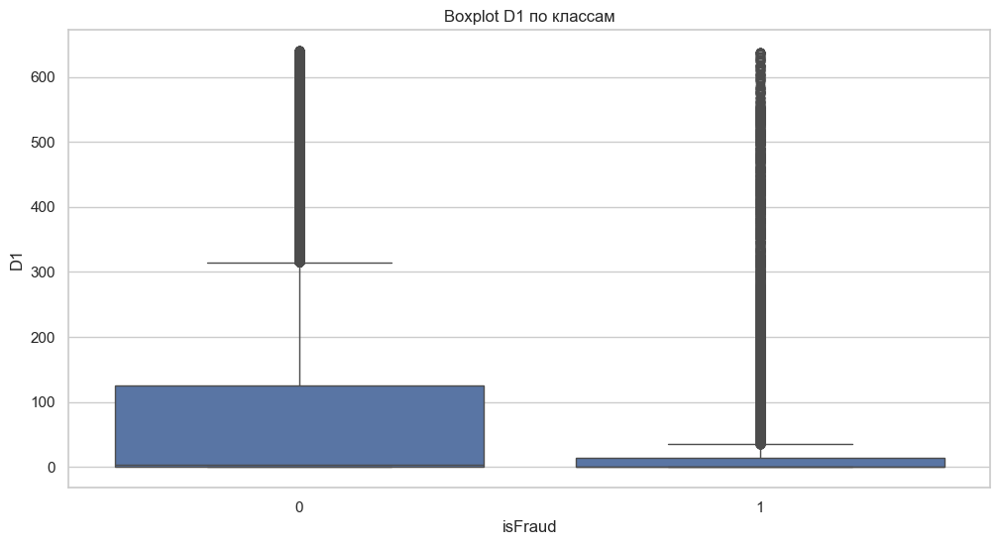

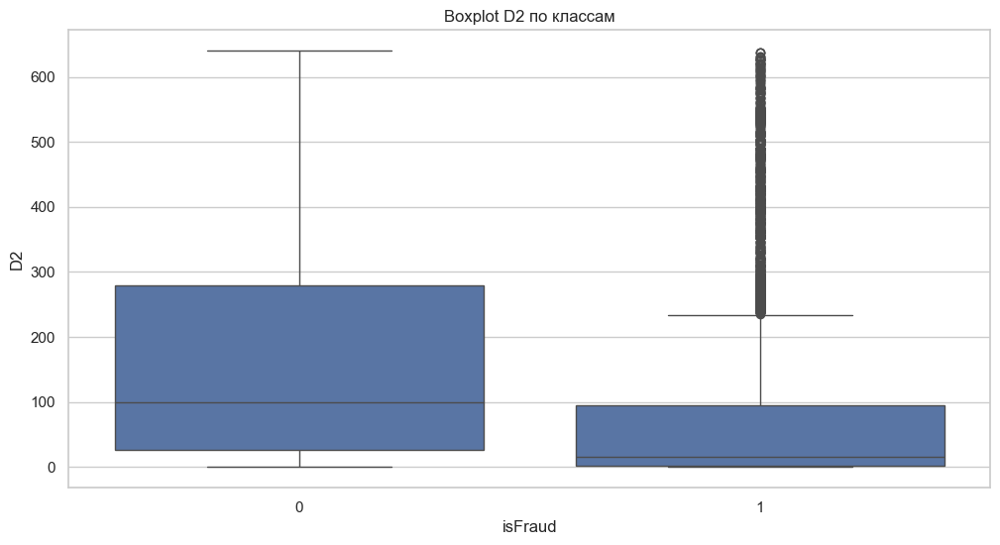

In [46]:
key_features = ['TransactionAmt', 'dist1', 'dist2', 'D1', 'D2']
for col in key_features:
    if col in train.columns:
        plt.figure(figsize=(12,6))
        sns.boxplot(x='isFraud', y=col, data=train)
        plt.title(f'Boxplot {col} по классам')
        plt.show()


## Минимальная обработка признаков

### 1. Обработка редких категорий


In [47]:
#for col in categorical_features:
#    rare_values = train[col].value_counts()[train[col].value_counts() < 10].index
#    train[col] = train[col].apply(lambda x: 'rare' if x in rare_values else x)
#    print(f'Признак {col}: заменено {len(rare_values)} редких категорий на "rare"')


### 2. Обработка TransactionDT

> Важно! Так как `TransactionDT` - Временная метка (в секундах от некой базовой точки), то преобразования в новые признаки условное Так как у нас нет базовой точки отсчета (Предполагаю что это транзакции за какието  месяца 2018 года, но это предположение). Но как мне кажется даже в этом случае можно проследить тенденции

In [48]:
# на всякий случай отсортируем по TransactionDT
train = train.sort_values('TransactionDT')

# Найдем минимальное значение
min_timestamp = train['TransactionDT'].min()

# Преобразуем временные метки относительно минимальной
train['Relative_TransactionDT'] = train['TransactionDT'] - min_timestamp

# Преобразуем в дни, часы, минуты и т.д.
train['Transaction_day'] = train['Relative_TransactionDT'] // (24 * 60 * 60)  # в днях
train['Transaction_hour'] = (train['Relative_TransactionDT'] // 3600) % 24  # в часах
train['Transaction_weekday'] = (train['Relative_TransactionDT'] // (3600*24)) % 7
train['Transaction_day'] = train['Transaction_day'].astype(int)
train['Transaction_hour'] = train['Transaction_hour'].astype(int)
train['Transaction_weekday'] = train['Transaction_weekday'].astype(int)

# Новые признаки на основе TransactionDT
#train['weekday'] = (train['TransactionDT'] // (3600*24)) % 7
#train['hour'] = (train['TransactionDT'] // 3600) % 24


### 3. Обработка 'P_emaildomain', 'R_emaildomain'

In [49]:

# Группировка email-доменов
#email_domains = {
#    'google': 'gmail', 'gmail': 'gmail', 'att.net': 'other', 'twc.com': 'other',
#    'scranton.edu': 'other', 'verizon.net': 'other', 'protonmail.com': 'other',
#    'aol.com': 'aol', 'hotmail.com': 'hotmail', 'yahoo.com': 'yahoo', 
#    'yahoo.com.mx': 'yahoo', 'outlook.com': 'microsoft', 'icloud.com': 'apple'
#}
#for col in ['P_emaildomain', 'R_emaildomain']:
#    if col in train.columns:
#        train[col] = train[col].apply(lambda x: email_domains.get(x.split('.')[0], 'other'))

### 4. TransactionAmt - Анализ и очистка выбросов

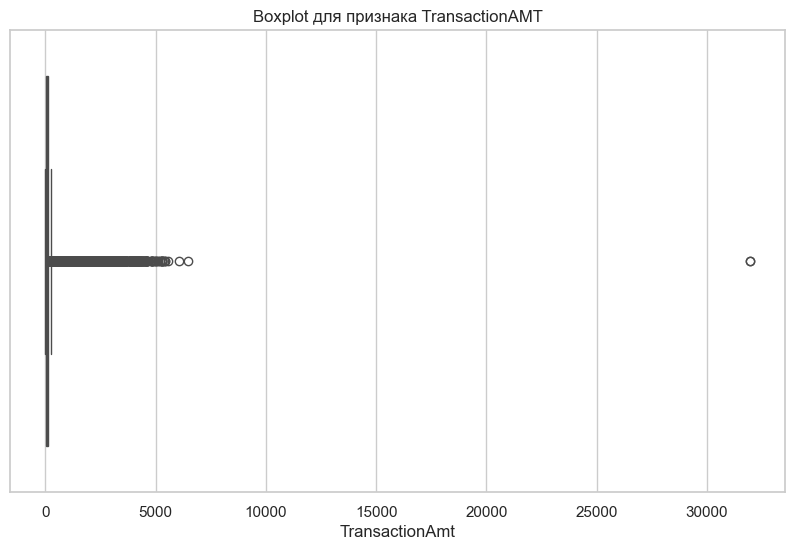

Границы для выбросов: -79.20 - 247.52
Число выбросов в TransactionAmt: 66482
    TransactionAmt  isFraud
7           422.50        0
31          363.89        0
41          774.00        0
56          500.00        0
58          380.21        0


In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Построим boxplot для анализа выбросов в TransactionAMT
plt.figure(figsize=(10, 6))
sns.boxplot(x=train['TransactionAmt'])
plt.title('Boxplot для признака TransactionAMT')
plt.show()

# Рассчитаем статистику для выявления выбросов
q1 = train['TransactionAmt'].quantile(0.25)  # 25-й перцентиль
q3 = train['TransactionAmt'].quantile(0.75)  # 75-й перцентиль
iqr = q3 - q1  # Интерквартильный размах

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

print(f"Границы для выбросов: {lower_bound:.2f} - {upper_bound:.2f}")

# Выбросы — это значения, которые лежат за пределами этих границ
outliers = train[(train['TransactionAmt'] < lower_bound) | (train['TransactionAmt'] > upper_bound)]
print(f"Число выбросов в TransactionAmt: {outliers.shape[0]}")
print(outliers[['TransactionAmt', 'isFraud']].head())


### Что делать с выбросами:

#### 1 Понимание контекста данных:


Сначала нужно проанализировать, не являются ли эти выбросы важными. Например, большие транзакции могут быть связаны с мошенничеством, и важно определить, как они коррелируют с целевой переменной isFraud. Для этого можно исследовать, какой процент мошенничеств происходит среди этих выбросов.

In [51]:
# Анализируем выбросы по классу isFraud
outliers_fraud = outliers['isFraud'].value_counts(normalize=True)
print(f"Распределение классов среди выбросов: {outliers_fraud}")


Распределение классов среди выбросов: isFraud
0    0.94928
1    0.05072
Name: proportion, dtype: float64


#### 2 Визуализация выбросов

Построим график, который покажет, как выбросы соотносятся с транзакциями. Это поможет понять, стоит ли их удалять или оставлять.

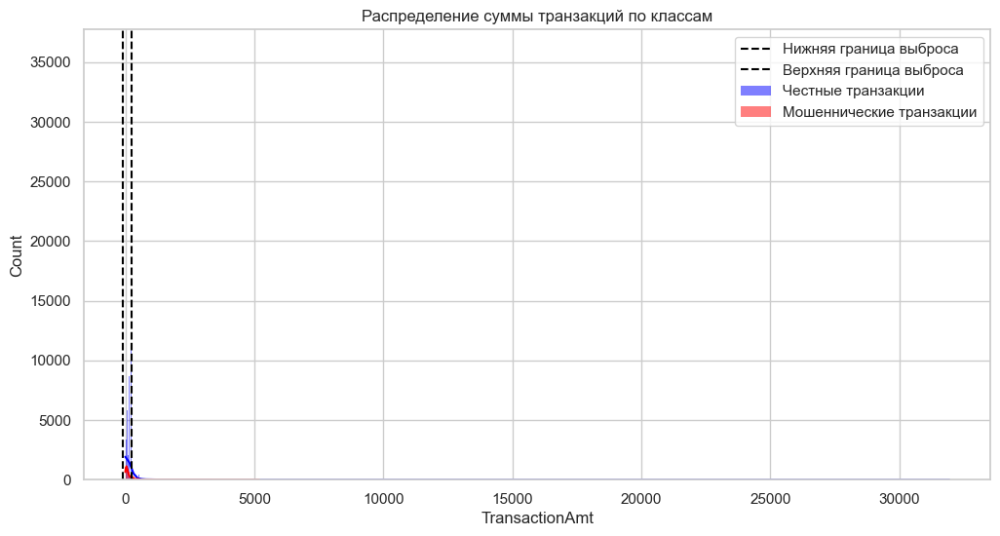

In [52]:
# Визуализация выбросов на графике
plt.figure(figsize=(12, 6))
sns.histplot(train[train['isFraud'] == 0]['TransactionAmt'], kde=True, color='blue', label='Честные транзакции')
sns.histplot(train[train['isFraud'] == 1]['TransactionAmt'], kde=True, color='red', label='Мошеннические транзакции')
plt.axvline(x=lower_bound, color='black', linestyle='--', label='Нижняя граница выброса')
plt.axvline(x=upper_bound, color='black', linestyle='--', label='Верхняя граница выброса')
plt.legend()
plt.title('Распределение суммы транзакций по классам')
plt.show()


Распределение классов среди выбросов показывает, что **только 5.07%** выбросов — это мошенничество (**`isFraud = 1`**), в то время как большинство выбросов (94.93%) приходится на честные транзакции (**`isFraud = 0`**).

### Выводы:

1. **Мошенничество среди выбросов**:
   - Это относительно небольшая доля. Это может означать, что выбросы, скорее всего, представляют собой редкие или экстраординарные транзакции, которые не обязательно связаны с мошенничеством. Возможно, это крупные, но не мошеннические транзакции.

2. **Что с этим делать**:
   - Поскольку мошенничество среди выбросов — это небольшая доля, можно рассматривать два подхода:
     - **Удалить выбросы**: Если выбросы действительно ошибочные или экстремальные, можно их удалить, так как они составляют меньшую часть данных.
     - **Оставить выбросы**: Поскольку они не столь сильно влияют на класс мошенничества, можно оставить их в данных, если они не слишком искажают общую картину.

В случае, если выбросы оставляем, то можно **применить трансформации**, такие как логарифмическое преобразование или бинирование.

Для **антифродовой задачи** (предсказания мошенничества), важным фактором является правильная обработка признаков, таких как сумма транзакции, чтобы модель могла эффективно различать мошеннические и честные транзакции, особенно когда суммы могут сильно варьироваться.


Для антифродовой задачи начнем с **логарифмирования**, так как это позволит модели учитывать широкий диапазон транзакций (включая большие суммы, которые могут быть мошенническими), не теряя важную информацию. Но и применим **бинирование** как дополнительный шаг для анализа и для улучшения интерпретируемости модели.


In [53]:
import numpy as np

# Преобразование столбца TransactionAMT
df_modified['log_TransactionAmt'] = np.log1p(df_modified['TransactionAmt'])

In [54]:

bins = [0, 100, 1000, 5000, 10000, np.inf]
labels = ['Low', 'Medium', 'High', 'Very High', 'Extremely High']

df_modified['TransactionAmt_binned'] = pd.cut(df_modified['TransactionAmt'], bins=bins, labels=labels)

# Альтернативный способ:  Биннинг суммы транзакции по квантилям
#train['TransactionAmt_bin'] = pd.qcut(train['TransactionAmt'], q=10, duplicates='drop')


#### Добавление признака выброса

Чтобы модель могла учитывать выбросы и их связь с мошенничеством, можно добавить новый признак, который будет отмечать, является ли транзакция выбросом.

In [55]:
df_modified['isOutlier'] = ((train['TransactionAmt'] < lower_bound) | (train['TransactionAmt'] > upper_bound)).astype(int)

Это поможет модели явно учитывать, что транзакция относится к выбросам, что может быть полезно для предсказания мошенничества.

In [56]:
df_modified[['TransactionAmt', 'log_TransactionAmt', 'TransactionAmt_binned']].describe()

,TransactionAmt,log_TransactionAmt
count,395677.000000,395677.000000
mean,132.255826,4.350518
std,240.355221,0.955018
min,0.251000,0.223943
25%,40.000000,3.713572
50%,67.950000,4.233382
75%,124.762000,4.834391
max,31937.391000,10.371564


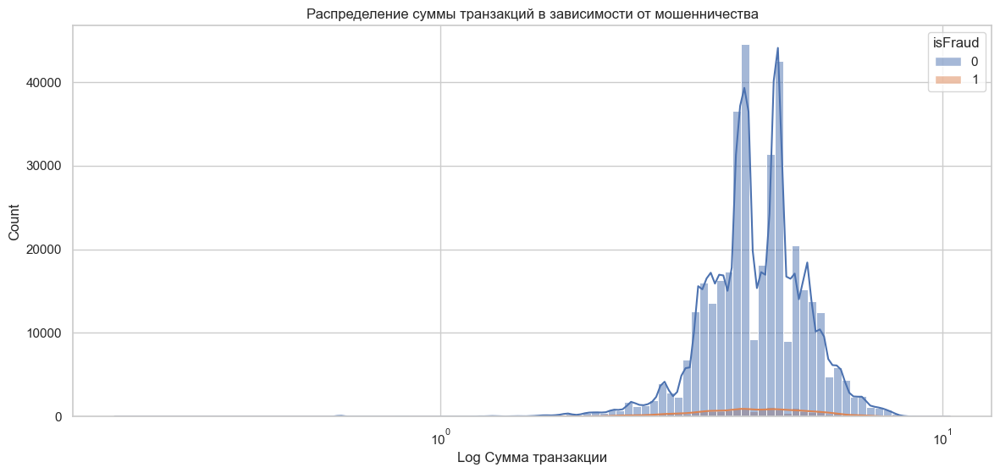

In [57]:
# Распределение сумм транзакций
plt.figure(figsize=(14,6))
sns.histplot(data=df_modified, x='log_TransactionAmt', hue='isFraud', bins=100, log_scale=True, kde=True)
plt.title('Распределение суммы транзакций в зависимости от мошенничества')
plt.xlabel('Log Сумма транзакции')
plt.show()


## Отбор признаков

## 1. Возьмем все признаки

Для начала попробует взять все признаки с минимальной обработкой для обучения базовых моделей.

## 2. **Минимальная обработка признаков**
- Для числовых — оставим как есть или логарифмируем.
- Для категориальных — **Label Encoding** или **One-Hot Encoding**.
- **Без сложных** feature engineering.

Идея baseline:  
> "Проверить, возможно ли получить приемлемое качество на существующем датасете без сложной обработки."

## 3. **Строим baseline модель**
Типичная связка:
- Модель: `LightGBM`, `CatBoost`, `XGBoost`, `LogisticRegression`, `RandomForest`.
- Потери: **LogLoss**, **AUC ROC**.

Просто запускаем без оптимизаций. Смотрим, **какое качество вообще возможно без ухищрений**.

# 🧠 Главное правило baseline:
> Сделать настолько простую модель, чтобы потом точно видеть — где улучшения работают.

In [58]:
#base_columns = [
#    'isFraud',
#    'log_TransactionAmt',
#    'TransactionAmt_binned',
#    'ProductCD',
#    'card4',
#    'card6',
#    'Transaction_hour', 
#    'Transaction_weekday',
#    'P_emaildomain',
#    #'DeviceType',
#    #'DeviceInfo'
#]

#df_modified[base_columns].head()

In [59]:
from sklearn.calibration import LabelEncoder
from sklearn.preprocessing import StandardScaler

#numeric_features = ['log_TransactionAmt', 'Transaction_hour', 'Transaction_weekday']
#categorical_features = ['ProductCD', 'card4', 'card6', 'P_emaildomain', 'DeviceType', 'DeviceInfo']

# Числовые и категориальные признаки
numeric_features = df_modified.select_dtypes(include=['number']).columns
categorical_features = df_modified.select_dtypes(include=['object', 'category']).columns

base_train = df_modified.copy()



# Легкая предобработка
for col in categorical_features:
    #base_train[col] = base_train[col].fillna('unknown')
    base_train[col] = base_train[col].astype(str)
    le = LabelEncoder()
    base_train[col] = le.fit_transform(base_train[col])



# 2. Обработка числовых признаков (заполнение пропусков медианой)
#scaler = StandardScaler()
#base_train[numeric_features] = scaler.fit_transform(base_train[numeric_features])


base_train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V319,V320,V321,Relative_TransactionDT,Transaction_day,Transaction_hour,Transaction_weekday,log_TransactionAmt,TransactionAmt_binned,isOutlier
2,2987002,0,86469,59.0,4,8721,389,41,3,58,...,0.0,0.0,0.0,0,0,0,0,4.094345,2,0
4,2987004,0,86506,50.0,1,8608,413,41,2,2,...,0.0,0.0,0.0,37,0,0,0,3.931826,2,0
5,2987005,0,86510,49.0,4,9617,454,41,3,106,...,0.0,0.0,0.0,41,0,0,0,3.912023,2,0
6,2987006,0,86522,159.0,4,1860,259,41,3,58,...,0.0,0.0,0.0,53,0,0,0,5.075174,3,0
8,2987008,0,86535,15.0,1,7405,0,41,3,106,...,0.0,0.0,0.0,66,0,0,0,2.772589,2,0


In [60]:
# Простая модель
#X = base_train[numeric_features + categorical_features]
X = base_train.drop(labels=['TransactionID', 'TransactionDT', 'Relative_TransactionDT', 'TransactionAmt', 'isOutlier',  'isFraud'], axis=1)
y = base_train['isFraud']

1. **Разделим данные на обучение и валидацию.**
   - Если это транзакции во времени (как в фроде) — разбиение должно быть аккуратным, **без перемешивания**.
   - Иначе — стандартное `train_test_split`.

In [61]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, shuffle=False
)

### LogisticRegression

In [62]:
y_train.head()

2    0
4    0
5    0
6    0
8    0
Name: isFraud, dtype: int64

In [63]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

LogisticRegression(random_state=42)

Recall: 0.0165
Precision: 0.0352
ROC-AUC: 0.6779
PR-AUC: 0.0687


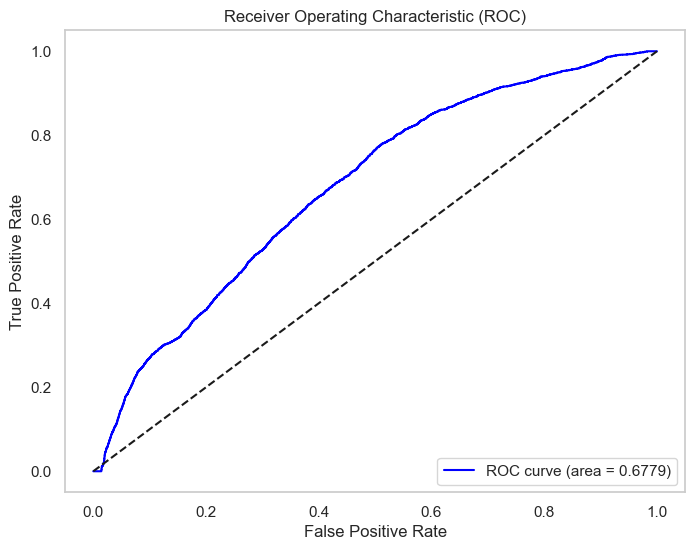

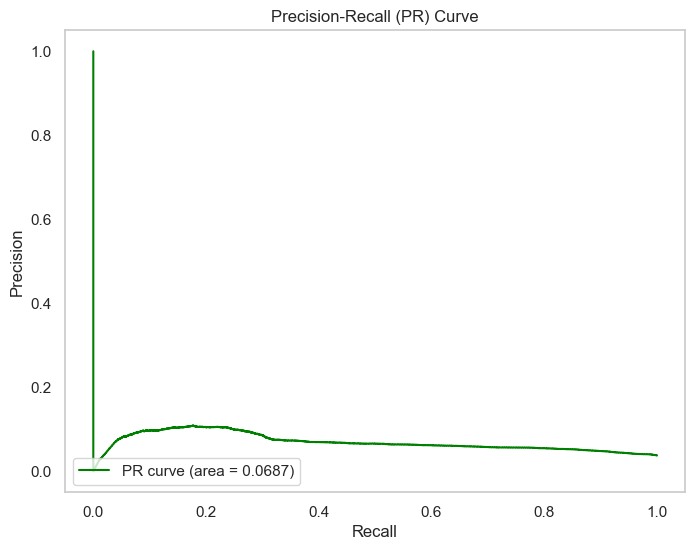

In [64]:
eval(model, X_val, y_val)

### Анализ метрик и графиков базовой модели LogisticRegression

#### Метрики

1. **Recall (Полнота): 0.0165**
   - Низкое значение полноты указывает на то, что модель обнаруживает лишь небольшую долю истинных положительных классов. Это может означать, что многие случаи остаются недетектированными.

2. **ROC-AUC: 0.6779**
   - Значение выше 0.5, но близкое к нему, что говорит о базовой способности модели различать классы. Однако это можно улучшить.

3. **PR-AUC: 0.0687**
   - Низкое значение PR-AUC указывает на ограниченную точность модели в условиях дисбаланса классов. Модель плохо справляется с обнаружением положительных примеров.

#### ROC-кривая

- Кривая показывает, что модель имеет лучшую производительность, чем случайная, но остаётся достаточно посредственной.
- Пространство между кривой и диагональной линией "случайного угадывания" небольошое, что указывает на необходимость улучшения модели.

#### PR-кривая

- PR-кривая лежит близко к осям, подтверждая низкую точность в условиях низкой полноты.
- Модель сталкивается с проблемами в задачах, где положительные наблюдения редки или распределены неравномерно.

### Как можно улучшенить

1. **Улучшение выборки:**
   - Рассмотреть методы корректировки дисбаланса классов, такие как oversampling или undersampling.

2. **Тюнинг модели:**
   - Провести настройку гиперпараметров модели с использованием поиска по сетке или байесовской оптимизации.

3. **Сложные модели:**
   - Попробовать более сложные модели, такие как Random Forest, Gradient Boosting или нейронные сети.

4. **Добавление признаков:**
   - Исследовать возможность создания и добавления новых признаков, которые могут повысить объяснительную силу модели.

### RandomForest

In [65]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [66]:
# Получение важности признаков
importances = model.feature_importances_

# Создание списка признаков с их важностями
feature_names = X_train.columns  # или просто список имен признаков
important_features = list(zip(feature_names, importances))

# Сортировка по важности
important_features.sort(key=lambda x: x[1], reverse=True)

# Отображение наиболее важных признаков
for feature in important_features:
    print(f"Feature: {feature[0]}, Importance: {feature[1]}")

Feature: Transaction_day, Importance: 0.04622617146606466
Feature: log_TransactionAmt, Importance: 0.04228761715509563
Feature: card1, Importance: 0.040653156721179515
Feature: C1, Importance: 0.03694923865669872
Feature: Transaction_hour, Importance: 0.031715858886638304
Feature: C13, Importance: 0.031237218459746603
Feature: card2, Importance: 0.030617268133503392
Feature: V45, Importance: 0.025648026157634632
Feature: C14, Importance: 0.025559525456906533
Feature: addr1, Importance: 0.02356516677320904
Feature: P_emaildomain, Importance: 0.0232171314371076
Feature: C2, Importance: 0.022430283730395524
Feature: Transaction_weekday, Importance: 0.02144223868053365
Feature: C4, Importance: 0.020234205742569327
Feature: V44, Importance: 0.020129928162599942
Feature: C11, Importance: 0.01983206287937669
Feature: card5, Importance: 0.01694921763945484
Feature: C8, Importance: 0.016359974595823622
Feature: C10, Importance: 0.016240155541713444
Feature: C12, Importance: 0.01622134991102479


Recall: 0.3591
Precision: 0.8227
ROC-AUC: 0.8948
PR-AUC: 0.4999


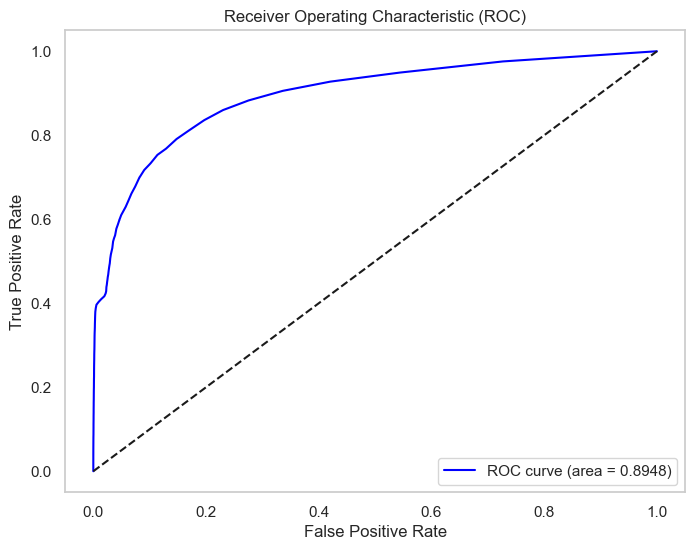

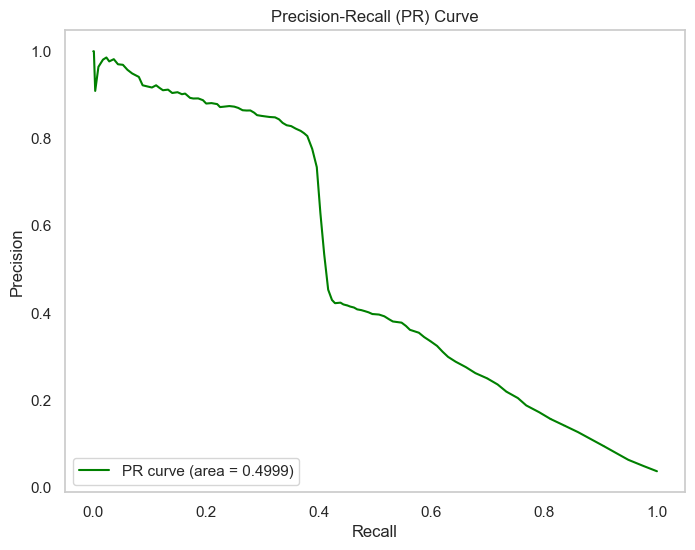

In [67]:
eval(model, X_val, y_val)

### Анализ метрик и графиков базовой модели RandomForestClassifier

#### Метрики

1. **Recall (Полнота): 0.3591**
   - Сравнительно высокое значение полноты указывает на способность модели обнаруживать значительное количество истинных положительных классов по сравнению с предыдущей моделью.

2. **ROC-AUC: 0.8948**
   - Высокое значение ROC-AUC демонстрирует хорошую способность модели различать классы. Это показывает, что модель справляется с задачей лучше, чем просто случайное угадывание.

3. **PR-AUC: 0.4999**
   - Значение PR-AUC выше, чем у LogisticRegression, указывая на лучшую точность в задачах с дисбалансом классов.

#### ROC-кривая

- ROC-кривая сильно выгнута вверх, подтверждая высокую точность модели в различении классов.
- Модель демонстрирует хороший баланс между чувствительностью (True Positive Rate) и специфичностью (False Positive Rate).

#### PR-кривая

- Кривая выше и более плавная, чем у LogisticRegression, указывая на лучшее качество работы модели в условиях дисбаланса.
- Сохранение относительно высокого уровня precision при увеличении recall показывает эффективность модели.

### Как можно улучшенить

1. **Тюнинг гиперпараметров:**
   - Оптимизация параметров модели (например, количество деревьев, глубина) может ещё больше улучшить производительность.

2. **Учет важности признаков:**
   - Провести анализ важности признаков, чтобы понять, какие из них оказывают большее влияние, и подумать о возможном добавлении новых.

3. **Тюнинг порога:**
   - Рассмотреть возможность изменения порога вероятности для повышения полноты или точности в зависимости от цели задачи.

4. **Увеличение данных:**
   - Если возможно, расширение объема данных может улучшить обучение модели.

### Поиск наилучших гиперпараметров

In [68]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.metrics import roc_auc_score

# Сортируем данные по времени
#train = train.sort_values('TransactionDT')

#X = train.drop(columns=['isFraud'])
#y = train['isFraud']

# TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

def objective(trial):
    # Параметры Random Forest
    params = {
        'class_weight': trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample', None]),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),  # исправлено
        'random_state': 42,
        'n_jobs': -1,
    }
    
    # Создаём модель
    model = RandomForestClassifier(**params)
    
    # Кросс-валидация по времени
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring='roc_auc')
    
    # Оптимизируем среднее значение ROC AUC
    return scores.mean()

# Оптимизация
sampler = optuna.samplers.TPESampler(seed=42)  # Используем seed для воспроизводимости
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)


[I 2025-05-19 23:29:33,349] A new study created in memory with name: no-name-bb9e0606-78bb-4203-a6ba-046dd17175d9
[I 2025-05-19 23:30:21,931] Trial 0 finished with value: 0.8711224481293062 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 639, 'max_depth': 5, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8711224481293062.
[I 2025-05-19 23:30:51,433] Trial 1 finished with value: 0.8657349672188165 and parameters: {'class_weight': None, 'n_estimators': 850, 'max_depth': 6, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.8711224481293062.
[I 2025-05-19 23:31:07,410] Trial 2 finished with value: 0.8796393314456072 and parameters: {'class_weight': None, 'n_estimators': 225, 'max_depth': 8, 'min_samples_split': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8796393314456072.
[I 2025-05-19 23:32:01,111] Trial 3 finished with val

Лучшие параметры: {'class_weight': 'balanced', 'n_estimators': 742, 'max_depth': 20, 'min_samples_split': 17, 'min_samples_leaf': 19, 'max_features': 'sqrt'}


In [69]:

#params = {'n_estimators': 801, 'max_depth': 12, 'min_samples_split': 17, 'min_samples_leaf': 11, 'max_features': 'log2', 'random_state': 42}
#params = {'n_estimators': 538, 'max_depth': 12, 'min_samples_split': 4, 'min_samples_leaf': 19, 'max_features': 'sqrt', 'random_state': 42}
#params = {'n_estimators': 895, 'max_depth': 12, 'min_samples_split': 20, 'min_samples_leaf': 13, 'max_features': 'sqrt'}
#params = {'n_estimators': 821, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
#params = {'n_estimators': 470, 'max_depth': 20, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
params = {'class_weight': 'balanced', 'n_estimators': 742, 'max_depth': 20, 'min_samples_split': 17, 'min_samples_leaf': 19, 'max_features': 'sqrt'}
model = RandomForestClassifier(**params)
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=19, min_samples_split=17,
                       n_estimators=742)

In [70]:
# Получение важности признаков
importances = model.feature_importances_

# Создание списка признаков с их важностями
feature_names = X_train.columns  # или просто список имен признаков
important_features = list(zip(feature_names, importances))

# Сортировка по важности
important_features.sort(key=lambda x: x[1], reverse=True)

# Отображение наиболее важных признаков
for feature in important_features:
    print(f"Feature: {feature[0]}, Importance: {feature[1]}")

Feature: C13, Importance: 0.05134399116042376
Feature: C14, Importance: 0.048121601134910916
Feature: C1, Importance: 0.03195837319767308
Feature: C4, Importance: 0.029582261647719012
Feature: C8, Importance: 0.02656800049867363
Feature: Transaction_day, Importance: 0.026256491135259987
Feature: C2, Importance: 0.025969847927537572
Feature: C10, Importance: 0.025645853696422038
Feature: log_TransactionAmt, Importance: 0.02306145592484589
Feature: C11, Importance: 0.01880493156160418
Feature: C12, Importance: 0.018780517676197983
Feature: ProductCD, Importance: 0.018707332458055538
Feature: card3, Importance: 0.01821342477138819
Feature: card1, Importance: 0.016596837277656266
Feature: card2, Importance: 0.015389979628706741
Feature: C7, Importance: 0.014786597784566115
Feature: D1, Importance: 0.014511120068897055
Feature: V308, Importance: 0.013111295534651752
Feature: C6, Importance: 0.012886464378756747
Feature: D15, Importance: 0.012566963985499774
Feature: P_emaildomain, Importanc

Список важности признаков в модели `RandomForestClassifier` показывает, какие признаки наиболее влияют на точность модели. Основные выводы:

1. **Наиболее важные признаки:**
   - Признаки типа `C1`, `C13`, `V45` и другие в начале списка имеют наибольшую важность. Они оказывают значительное влияние на предсказания модели и могут быть ключевыми факторами в анализе.

2. **Средняя важность:**
   - Признаки, такие как `log_TransactionAmt`, `D1`, и `P_emaildomain`, также вносят свой вклад, но в меньшей степени. Их можно рассматривать как вспомогательные для улучшения результатов модели.

3. **Мало важные признаки:**
   - Признаки внизу списка, такие как `V121`, `V117`, и `V305`, могут быть практически незначимыми. Их можно рассмотреть для исключения из модели, чтобы упростить её и уменьшить вычислительную нагрузку.

4. **Использование полученной информации:**
   - Основываясь на этом анализе, можно улучшать модель, фокусируясь на наиболее важных признаках.
   - Исключение малозначимых признаков может упростить модель без значительной потери качества.

Recall: 0.6200
Precision: 0.3311
ROC-AUC: 0.9049
PR-AUC: 0.5238


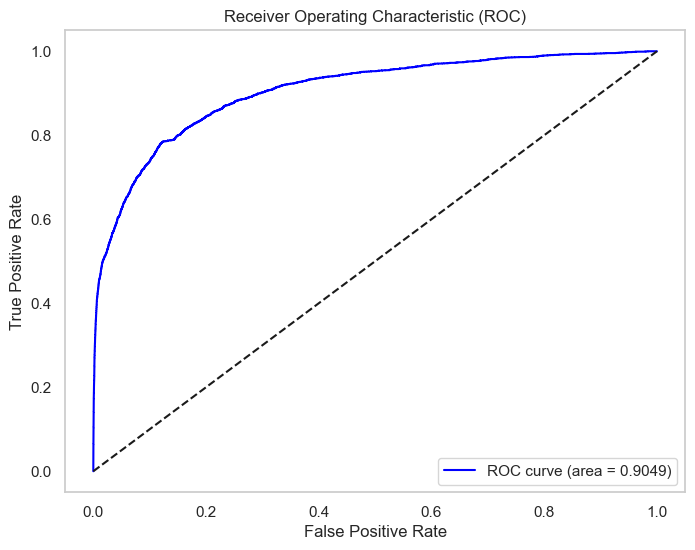

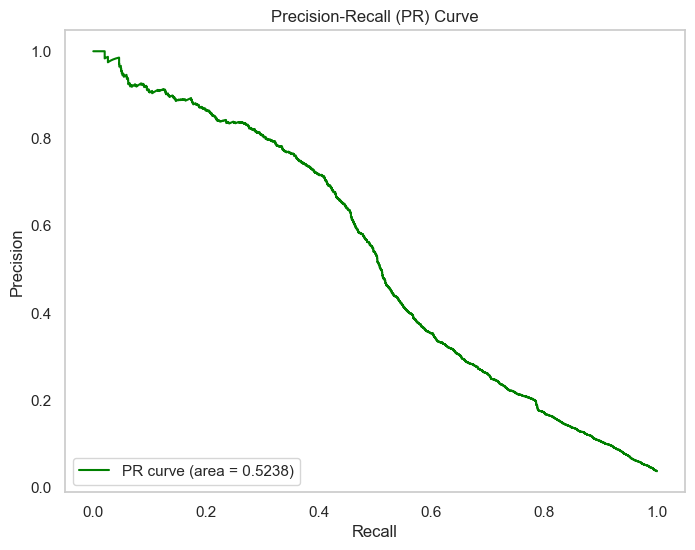

In [71]:
eval(model, X_val, y_val)

### Анализ метрик и графиков модели RandomForestClassifier с оптимизированными гиперпараметрами

#### Метрики


**Recall: 0.6220**
- **Анализ**: Уровень полноты (recall) составляет 62.2%, что означает, что модель успешно выявляет около 62% мошеннических случаев. Для задачи fraud-detection показатель должен быть не ниже 80-85%, что указывает на необходимость улучшений.

**ROC-AUC: 0.9049**
- **Анализ**: Высокое значение ROC-AUC (0.9049) указывает на то, что модель хорошо различает между классами "мошенничество" и "не-мошенничество" в общем плане. Однако, этот показатель менее информативен для несбалансированных наборов данных, так как он учитывает и случаи, где отрицательный класс преобладает.

**PR-AUC: 0.5238**
- **Анализ**: Значение PR-AUC составляет 0.5238, что свидетельствует о том, что баланс между precision и recall неудовлетворительный. Это указывает на то, что модель нуждается в улучшениях, особенно если целью является улучшение выявления мало представленных положительных классов (мошенничество).


#### ROC-кривая:
- **Интерпретация**: Кривая ROC показывает отношения между TPR (доля истинно положительных) и FPR (доля ложноположительных).
- **Высокий ROC-AUC (0.9049)** указывает на то, что модель хорошо различает между положительными и отрицательными классами в общем плане, но это не обязательно означает её эффективность для редких классов или в условиях несбалансированных данных.

#### PR-кривая:
- **Интерпретация**: Кривая Precision-Recall более показательна для задач с несбалансированными данными, поскольку напрямую отражает качество модели для выявления положительных событий.
- **PR-AUC (0.5238)** со сравнительно низким значением указывает на проблемы с балансом между точностью и полнотой. Эта кривая показывает, что при попытке достичь высоких значений recall precision значительно падает.


### Как можно улучшенить

1. **Настройка порога**: Исследовать различные пороги, чтобы найти тот, который обеспечит необходимый уровень recall. Существующие метрики указывают на необходимость его пересмотра.

2. **Увеличение данных**: Увеличеть количество данных для обучения, возможно, использованием методов генерации синтетических данных, таких как SMOTE, чтобы улучшить обучение модели.

3. **Улучшение признаков**: Пересмотреть набор признаков, возможно, с помощью методик отбора признаков и генерации дополнительных признаков, для того чтобы улучшить результаты.

4. **Эксперименты с моделями**: Рассмотреть различные алгоритмы или ансамбли моделей, которые могут быть более эффективными в задачах с несбалансированными данными.

5. **Тонкая настройка гиперпараметров**: Провести дополнительную оптимизацию гиперпараметров, учитывая при этом стратегию балансировки классов и различные веса ошибок.

Эти меры могут помочь добиться более высокого значения полноты, что критически важно для задачи обнаружения мошенничества.

## Определение оптимального порога

Так как мы решаем задачу fraud detection, а это задача в которой стоймость ошибки ненайденной мошейнеческой операции выше, чем стоймость ошибки ложного определения. Т.е.  Recall >= 0.95 (95%). Поэтому нужно выбрать такой treshold, который будет соответствовать условиям

### Определение оптимального порога (trashold)

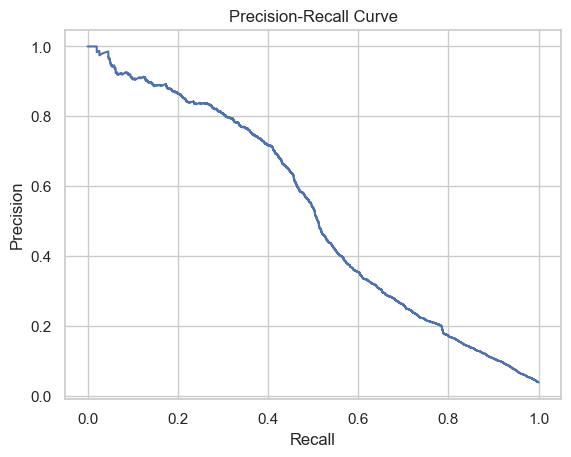

In [72]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve

#
y_proba = model.predict_proba(X_val)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_val, y_proba)

plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [73]:
# Функция для выбора порога
def find_threshold_for_recall(y_true, y_scores, target_recall=0.95):
    precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
    recall = recall[:-1]
    precision = precision[:-1]

    mask = recall >= target_recall
    if not np.any(mask):
        return None
    
    best_idx = np.argmax(precision[mask])
    return thresholds[mask][best_idx]

optimal_threshold = find_threshold_for_recall(y_val, y_proba, target_recall=0.95)
print('Оптимальный порог для целевого recall:', optimal_threshold)

Оптимальный порог для целевого recall: 0.15891351744488053


In [74]:
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, recall_score
import optuna
import numpy as np

#
optimal_threshold = find_threshold_for_recall(y_val, y_proba, target_recall=0.95)
print('Оптимальный порог для целевого recall:', optimal_threshold)


def custom_recall_with_threshold(y_true, y_proba, optimal_threshold=0.5, **kwargs):
    """
    Рассчет метрики recall (полноты) на основе заданного порога вероятностей.

    Parameters:
    y_true (array-like): Истинные бинарные метки.
    y_proba (array-like): Прогнозируемые вероятности.
    optimal_threshold (float): Порог для преобразования вероятностей в бинарные предсказания.
    
    Returns:
    float: Recall score.
    """
    # Преобразуем вероятности в предсказания классов
    y_pred = (y_proba >= optimal_threshold).astype(int)
    
    # Возвращаем метрику recall
    return recall_score(y_true, y_pred)


# Используем TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

n_jobs = -1

def objective(trial):
    params = {
        'class_weight': trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample', None]),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        'random_state': 42,
        'n_jobs': n_jobs,
    }

    model = RandomForestClassifier(**params)
    


    try:
        # Оценка модели
        #print(f'##### Оценка модели')
        scorer = make_scorer(custom_recall_with_threshold, needs_proba=True, optimal_threshold=optimal_threshold)
        scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring=scorer, n_jobs=n_jobs)
        print(f"Trial completed with mean score: {np.nanmean(scores)}")
        return np.nanmean(scores)
    except Exception as e:
        print(f"Error during evaluation: {e}")
        return np.nan

# Запуск Optuna
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)

[I 2025-05-20 00:34:01,387] A new study created in memory with name: no-name-bc1ed4f6-3391-4e96-a390-de1263a9b6ed


Оптимальный порог для целевого recall: 0.15891351744488053


[I 2025-05-20 00:34:36,789] Trial 0 finished with value: 0.7093918394201726 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 639, 'max_depth': 5, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7093918394201726.


Trial completed with mean score: 0.7093918394201726


[I 2025-05-20 00:35:03,002] Trial 1 finished with value: 0.13239591919266158 and parameters: {'class_weight': None, 'n_estimators': 850, 'max_depth': 6, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.7093918394201726.


Trial completed with mean score: 0.13239591919266158


[I 2025-05-20 00:35:18,398] Trial 2 finished with value: 0.21421040729397473 and parameters: {'class_weight': None, 'n_estimators': 225, 'max_depth': 8, 'min_samples_split': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7093918394201726.


Trial completed with mean score: 0.21421040729397473


[I 2025-05-20 00:35:59,084] Trial 3 finished with value: 0.7112087017384027 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 647, 'max_depth': 6, 'min_samples_split': 3, 'min_samples_leaf': 19, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.7112087017384027


[I 2025-05-20 00:36:20,678] Trial 4 finished with value: 0.16135412242056518 and parameters: {'class_weight': None, 'n_estimators': 496, 'max_depth': 5, 'min_samples_split': 11, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.16135412242056518


[I 2025-05-20 00:36:51,779] Trial 5 finished with value: 0.7107155125925253 and parameters: {'class_weight': 'balanced', 'n_estimators': 592, 'max_depth': 6, 'min_samples_split': 20, 'min_samples_leaf': 16, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.7107155125925253


[I 2025-05-20 00:37:00,436] Trial 6 finished with value: 0.6592348788112407 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 276, 'max_depth': 3, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.6592348788112407


[I 2025-05-20 00:37:30,138] Trial 7 finished with value: 0.2802070840123985 and parameters: {'class_weight': None, 'n_estimators': 226, 'max_depth': 17, 'min_samples_split': 3, 'min_samples_leaf': 20, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.2802070840123985


[I 2025-05-20 00:38:30,613] Trial 8 finished with value: 0.592887627128026 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 756, 'max_depth': 16, 'min_samples_split': 3, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.592887627128026


[I 2025-05-20 00:38:56,263] Trial 9 finished with value: 0.7009650130090433 and parameters: {'class_weight': 'balanced', 'n_estimators': 380, 'max_depth': 8, 'min_samples_split': 15, 'min_samples_leaf': 13, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.7009650130090433


[I 2025-05-20 00:39:54,016] Trial 10 finished with value: 0.6725529494958975 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 884, 'max_depth': 12, 'min_samples_split': 15, 'min_samples_leaf': 20, 'max_features': 'log2'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.6725529494958975


[I 2025-05-20 00:40:46,386] Trial 11 finished with value: 0.6668787530638692 and parameters: {'class_weight': 'balanced', 'n_estimators': 564, 'max_depth': 11, 'min_samples_split': 20, 'min_samples_leaf': 16, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.6668787530638692


[I 2025-05-20 00:41:50,069] Trial 12 finished with value: 0.6669803725207861 and parameters: {'class_weight': 'balanced', 'n_estimators': 689, 'max_depth': 11, 'min_samples_split': 19, 'min_samples_leaf': 16, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.6669803725207861


[I 2025-05-20 00:42:21,336] Trial 13 finished with value: 0.7033901191438845 and parameters: {'class_weight': 'balanced', 'n_estimators': 449, 'max_depth': 8, 'min_samples_split': 16, 'min_samples_leaf': 16, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.7033901191438845


[I 2025-05-20 00:42:58,581] Trial 14 finished with value: 0.6762498283595583 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 970, 'max_depth': 3, 'min_samples_split': 11, 'min_samples_leaf': 18, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.6762498283595583


[I 2025-05-20 00:44:08,186] Trial 15 finished with value: 0.6158889057561187 and parameters: {'class_weight': 'balanced', 'n_estimators': 607, 'max_depth': 14, 'min_samples_split': 7, 'min_samples_leaf': 13, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.6158889057561187


[I 2025-05-20 00:45:48,150] Trial 16 finished with value: 0.5846489456838114 and parameters: {'class_weight': 'balanced', 'n_estimators': 738, 'max_depth': 19, 'min_samples_split': 13, 'min_samples_leaf': 13, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.5846489456838114


[I 2025-05-20 00:46:19,835] Trial 17 finished with value: 0.6948271059910034 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 365, 'max_depth': 9, 'min_samples_split': 18, 'min_samples_leaf': 18, 'max_features': 'sqrt'}. Best is trial 3 with value: 0.7112087017384027.


Trial completed with mean score: 0.6948271059910034


[I 2025-05-20 00:46:53,114] Trial 18 finished with value: 0.7146304808012316 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 803, 'max_depth': 6, 'min_samples_split': 11, 'min_samples_leaf': 18, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7146304808012316


[I 2025-05-20 00:47:00,926] Trial 19 finished with value: 0.6810496958465307 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 118, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 18, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.6810496958465307


[I 2025-05-20 00:48:01,293] Trial 20 finished with value: 0.6300380736613762 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 839, 'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 11, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.6300380736613762


[I 2025-05-20 00:48:31,626] Trial 21 finished with value: 0.7142545413438746 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 739, 'max_depth': 6, 'min_samples_split': 13, 'min_samples_leaf': 15, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7142545413438746


[I 2025-05-20 00:49:11,663] Trial 22 finished with value: 0.7139098869414189 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 969, 'max_depth': 6, 'min_samples_split': 12, 'min_samples_leaf': 20, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7139098869414189


[I 2025-05-20 00:49:43,140] Trial 23 finished with value: 0.6996433300710709 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 958, 'max_depth': 4, 'min_samples_split': 13, 'min_samples_leaf': 14, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.6996433300710709


[I 2025-05-20 00:50:19,264] Trial 24 finished with value: 0.7078178161215872 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 782, 'max_depth': 7, 'min_samples_split': 13, 'min_samples_leaf': 15, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7078178161215872


[I 2025-05-20 00:50:52,114] Trial 25 finished with value: 0.6990715873552931 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 993, 'max_depth': 4, 'min_samples_split': 10, 'min_samples_leaf': 18, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.6990715873552931


[I 2025-05-20 00:51:42,190] Trial 26 finished with value: 0.694877373948655 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 913, 'max_depth': 9, 'min_samples_split': 12, 'min_samples_leaf': 20, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.694877373948655


[I 2025-05-20 00:52:19,952] Trial 27 finished with value: 0.7088805158099056 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 821, 'max_depth': 7, 'min_samples_split': 16, 'min_samples_leaf': 17, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7088805158099056


[I 2025-05-20 00:53:08,765] Trial 28 finished with value: 0.639918861493181 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 707, 'max_depth': 13, 'min_samples_split': 9, 'min_samples_leaf': 11, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.639918861493181


[I 2025-05-20 00:53:37,969] Trial 29 finished with value: 0.7110068913854436 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 782, 'max_depth': 5, 'min_samples_split': 14, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7110068913854436


[I 2025-05-20 00:54:09,263] Trial 30 finished with value: 0.7001072257481672 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 932, 'max_depth': 4, 'min_samples_split': 12, 'min_samples_leaf': 14, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7001072257481672


[I 2025-05-20 00:54:40,050] Trial 31 finished with value: 0.7066516083213348 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 660, 'max_depth': 7, 'min_samples_split': 4, 'min_samples_leaf': 19, 'max_features': 'log2'}. Best is trial 18 with value: 0.7146304808012316.


Trial completed with mean score: 0.7066516083213348


[I 2025-05-20 00:55:06,396] Trial 32 finished with value: 0.7149342516167271 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 629, 'max_depth': 6, 'min_samples_split': 16, 'min_samples_leaf': 19, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.7149342516167271


[I 2025-05-20 00:55:29,466] Trial 33 finished with value: 0.10316161778627256 and parameters: {'class_weight': None, 'n_estimators': 857, 'max_depth': 5, 'min_samples_split': 16, 'min_samples_leaf': 19, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.10316161778627256


[I 2025-05-20 00:55:51,319] Trial 34 finished with value: 0.7128492488914283 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 522, 'max_depth': 6, 'min_samples_split': 18, 'min_samples_leaf': 17, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.7128492488914283


[I 2025-05-20 00:56:26,451] Trial 35 finished with value: 0.17448761036382232 and parameters: {'class_weight': None, 'n_estimators': 804, 'max_depth': 9, 'min_samples_split': 11, 'min_samples_leaf': 20, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.17448761036382232


[I 2025-05-20 00:56:56,450] Trial 36 finished with value: 0.7148209913901439 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 718, 'max_depth': 6, 'min_samples_split': 14, 'min_samples_leaf': 17, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.7148209913901439


[I 2025-05-20 00:57:25,892] Trial 37 finished with value: 0.7058665417085198 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 629, 'max_depth': 7, 'min_samples_split': 17, 'min_samples_leaf': 15, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.7058665417085198


[I 2025-05-20 00:57:39,541] Trial 38 finished with value: 0.025842474422304824 and parameters: {'class_weight': None, 'n_estimators': 713, 'max_depth': 3, 'min_samples_split': 14, 'min_samples_leaf': 17, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.025842474422304824


[I 2025-05-20 00:58:04,558] Trial 39 finished with value: 0.7113957944433192 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 666, 'max_depth': 5, 'min_samples_split': 14, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.7113957944433192


[I 2025-05-20 00:58:33,715] Trial 40 finished with value: 0.6964570380200205 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 575, 'max_depth': 8, 'min_samples_split': 10, 'min_samples_leaf': 15, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.6964570380200205


[I 2025-05-20 00:59:10,051] Trial 41 finished with value: 0.7135272425714837 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 878, 'max_depth': 6, 'min_samples_split': 12, 'min_samples_leaf': 19, 'max_features': 'log2'}. Best is trial 32 with value: 0.7149342516167271.


Trial completed with mean score: 0.7135272425714837


[I 2025-05-20 00:59:41,306] Trial 42 finished with value: 0.7154414090413668 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 751, 'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 17, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.7154414090413668


[I 2025-05-20 01:00:06,256] Trial 43 finished with value: 0.6982394611023992 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 743, 'max_depth': 4, 'min_samples_split': 15, 'min_samples_leaf': 17, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.6982394611023992


[I 2025-05-20 01:00:43,716] Trial 44 finished with value: 0.6856290532196899 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 634, 'max_depth': 10, 'min_samples_split': 17, 'min_samples_leaf': 18, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.6856290532196899


[I 2025-05-20 01:01:05,724] Trial 45 finished with value: 0.7056269118945971 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 479, 'max_depth': 7, 'min_samples_split': 14, 'min_samples_leaf': 14, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.7056269118945971


[I 2025-05-20 01:01:26,134] Trial 46 finished with value: 0.10426021121455901 and parameters: {'class_weight': None, 'n_estimators': 763, 'max_depth': 5, 'min_samples_split': 15, 'min_samples_leaf': 16, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.10426021121455901


[I 2025-05-20 01:01:54,887] Trial 47 finished with value: 0.7133158380125962 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 687, 'max_depth': 6, 'min_samples_split': 17, 'min_samples_leaf': 12, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.7133158380125962


[I 2025-05-20 01:02:21,858] Trial 48 finished with value: 0.6904008821365462 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 527, 'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.6904008821365462


[I 2025-05-20 01:03:24,203] Trial 49 finished with value: 0.6409956826537494 and parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 732, 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 19, 'max_features': 'log2'}. Best is trial 42 with value: 0.7154414090413668.


Trial completed with mean score: 0.6409956826537494
Лучшие параметры: {'class_weight': 'balanced_subsample', 'n_estimators': 751, 'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 17, 'max_features': 'log2'}


In [75]:
#params = {'n_estimators': 400, 'max_depth': 20, 'min_samples_split': 17, 'min_samples_leaf': 12, 'max_features': 'sqrt'}
#params = {'n_estimators': 418, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
#params = {'class_weight': 'balanced_subsample', 'n_estimators': 259, 'max_depth': 3, 'min_samples_split': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}
#params = {'class_weight': 'balanced_subsample', 'n_estimators': 751, 'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 17, 'max_features': 'log2'}
params = {'class_weight': 'balanced_subsample', 'n_estimators': 751, 'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 17, 'max_features': 'log2'}
model = RandomForestClassifier(**params)
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', max_depth=6,
                       max_features='log2', min_samples_leaf=17,
                       min_samples_split=15, n_estimators=751)

Recall: 0.7644
Precision: 0.1351
ROC-AUC: 0.8691
PR-AUC: 0.4170


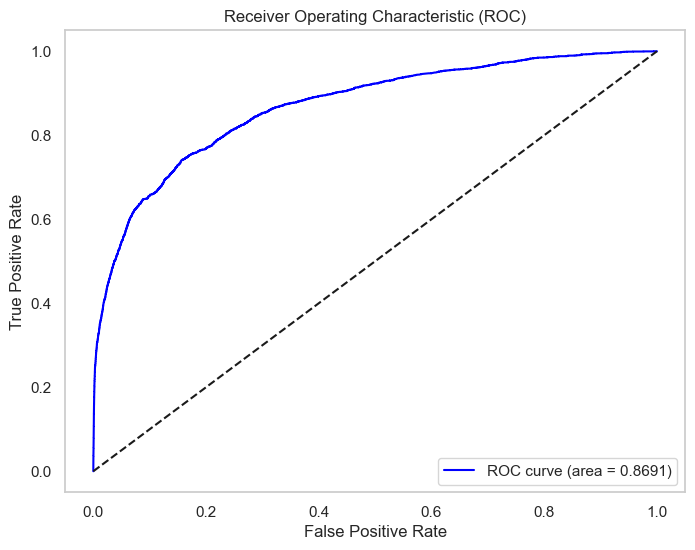

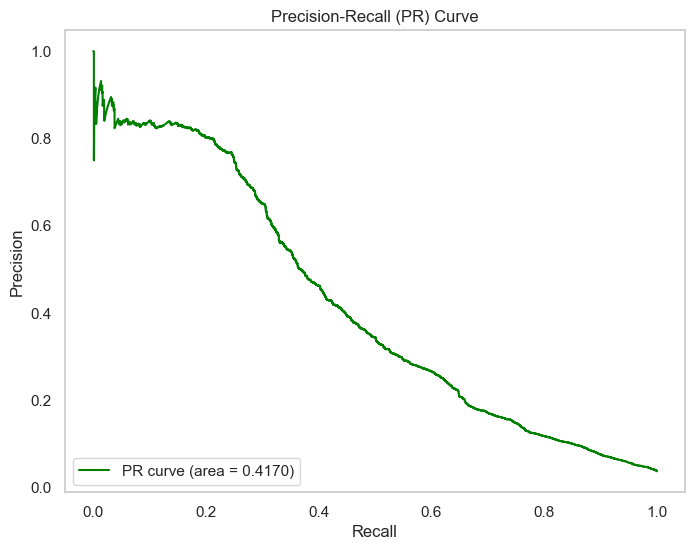

In [76]:
eval(model, X_val, y_val)

### Выводы по модели RandomForest с оптимальным порогом

1. **Recall (0.7644)**:
   - Модель достигла уровня `recall` 0.7644, что указывает на то, что она правильно идентифицирует около 76.44% всех положительных случаев. Это недостаточно для достижения целевого `recall=0.95`, необходимо пересмотреть баланс между `recall` и `precision`.

2. **ROC-AUC (0.8691)**:
   - Значение ROC-AUC 0.8691 говорит о хорошей способности модели различать классы. Модель хорошо справляется с задачей классификации как положительных, так и отрицательных примеров на уровне вероятностей.

3. **PR-AUC (0.4170)**:
   - PR-AUC является довольно низким, что свидетельствует о плохом компромиссе между точностью и полнотой на различных порогах. Это может быть связано с дисбалансом классов.

### Анализ графиков

1. **ROC-кривая**:
   - Кривая, изгибающаяся вверх и влево от диагональной линии, подчеркивает, что модель работает лучше случайной классификации. Однако есть области, где модель теряет точность, что может привести к ложно-положительным результатам.

2. **PR-кривая**:
   - Кривая сильно колеблется, что отражает значительные изменения в точности по мере изменения порога. Низкий PR-AUC указывает на то, что высокая полнота достигается за счет значительного количества ложноположительных.

### Как можно улучшенить

- **Оптимизация порогов**: Исследовать и скорректировать текущий порог, чтобы приблизиться к `recall=0.95`, возможно за счёт снижения точности — уместно в задаче антифрода.

- **Обработка классового дисбаланса**: Рассмотреть методы борьбы с дисбалансом классов, такие как увеличение количества положительных примеров или использование методик подвыборки.

- **Использование дополнительных признаков или улучшение качества данных**: Улучшение качества данных может помочь в повышении точности модели и улучшении метрик.

- **Гиперпараметрическая оптимизация**: Поискать оптимальные гиперпараметры.

## Выводы

### Сводная Таблица по Метрикам:

| Модель                                    | Recall   | Presision| ROC-AUC | PR-AUC  |
|-------------------------------------------|----------|----------|---------|---------|
| Logistic Regression                       | 0.0165   | 0.0352   | 0.6779  | 0.0687  |
| RandomForestClassifier (базовая)          | 0.3591   | 0.8227   | 0.8948  | 0.4999  |
| RandomForestClassifier (оптимизированная) | 0.6220   | 0.3311   | 0.9049  | 0.5238  |
| RandomForest с порогом для recall=0.95    | 0.7644   | 0.1351   | 0.8691  | 0.4170  |

### Общие выводы:

1. **Logistic Regression:** 
    - Модель показала себя как недостаточно эффективная для задачи обнаружения мошенничества. Низкие значения метрик, особенно recall и PR-AUC, указывают на слабую способность модели идентифицировать позитивные случаи (мошенничество). Её простота не позволяет адекватно справляться с дисбалансом классов.

2. **Базовый RandomForestClassifier:** 
    - Улучшение метрик по сравнению с логистической регрессией заметно. Recall и PR-AUC увеличились, что указывает на лучшую способность модели обнаруживать положительные случаи и балансировать между precision и recall. Но всё ещё недостаточно для достижения необходимого результата в условиях дисбаланса данных.

3. **Оптимизированный RandomForestClassifier:** 
    - Оптимизация гиперпараметров привела к значительному улучшению метрик, но все ещё далеко до достижения цели.

4. **RandomForest с оптимальным порогом:** 
    - Несмотря на увеличившийся recall до 76.44%, цель в 95% не достигнута, а precision катострофически низкий (всего 13.5%), а PR-AUC остается на низком уровне, что указывает на сложность поддержания высокой точности при попытке увеличить полноту.

### Как можно улучшить:
- **Оптимизация баланса:**
  - Рассмотреть методы балансировки классов.

- **Экспериметы с более сложными моделями:**
  - Провести эксперименты с более сложными алгоритмами машинного обучения.
  
